# Statistical Methods in Astrophysics Exercises

## Week 07: Regression & Samplers

### Personal Information

**Name:** physnya

### Exercise 1: Light curve fitting

The brightness of a variable star varies with time following the following sinusoidal model:

$m(t) = A \sin \left( \dfrac{2 \pi t}{T} + \phi \right) + m_0$

where $A$ is the amplitude, $T$ is the period, $\phi$ is the phase, and $m_0$ is the mean magnitude.

The star is observed at $N=32$ different random times $t_i$ (in days) over a year. Due to the variability of observing conditions, the measurement uncertainties of the observed magnitudes follow a heteroscedastic distribution, i.e., different data points have different uncertainties.

The expected uncertainties $\{\sigma_i\}$ are uniformly distributed between 0.2 mag and 0.4 mag. The observed magnitudes $m_i$ are generated by adding Gaussian noise to the true magnitudes at the observation times:

$m_i = m(t_i) + \epsilon_i$,

where $\epsilon_i \sim \mathcal{N}(0, \sigma_i^2)$, i.e., Gaussian noise with zero mean and standard deviation $\sigma_i$.

#### Question 1.1: inference with UltraNest

**Tasks:**
1. Simulate the light curve data $\{t_i, m_i, \sigma_i\}$ using the following true parameters: $A=1.5$ mag, $T=100$ days, $\phi=1$ rad, and $m_0=15$ mag. Plot the simulated light curve data with error bars, and overlay the true light curve model.
2. Infer parameters $(A, T, \phi, m_0)$ using the `UltraNest` package with uniform priors over the following ranges:
   - $A \in [0, 3]$ mag
   - $T \in [10, 300]$ days
   - $\phi \in [0, 2\pi]$ rad
   - $m_0 \in [10, 20]$ mag
3. Make triangle plots of the joint and marginalized posterior distributions of the parameters.
4. Report the mean, standard deviation, and 16-50-84 percentiles of the marginalized posterior distributions, as well as the covariance matrix of the joint posterior distribution.

In [74]:
# NOTE: Run this cell in the first place
# Load packages for numerical calculations and plotting
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Enable inline plotting in Jupyter notebooks
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.dpi'] = 300
%matplotlib inline
plt.rc('text', usetex = True)
plt.rc('font', family = 'serif')
# 由于设置了图片的高 dpi 和字体，所以编译速度变慢.

In [75]:
def sim_light_curve(ndays, A=1.5, T=100, phi=1.0, m0=15, seed=42):
    """Simulate a light curve with Gaussian noise.
    Args:
        ndays: int, number of days to simulate
        A: float, amplitude of variability
        T: float, period of variability in days
        phi: float, phase of variability
        m0: float, mean magnitude
        seed: int, random seed for reproducibility
    Returns:
        t: array, time array in days
        m_obs: array, observed magnitudes with noise
        sigma: array, measurement uncertainties
    """
    rng = np.random.default_rng(seed)
    t = np.sort(rng.uniform(0, 365, ndays))
    sigma = rng.uniform(0.2, 0.4, ndays)

    m_true = A * np.sin(2 * np.pi * t / T + phi) + m0
    m_obs = m_true + rng.normal(0, sigma, ndays)

    return t, m_obs, sigma

In [76]:
# Set the random seed
seed = 2024011182

# Setup parameters
ndays = 32
param_names = ['A', 'T', 'phi', 'm0']
param_true = [1.5, 100, 1.0, 15.0]
param_ranges = np.array([(0, 3), (10, 300), (0, 2*np.pi), (10, 20)])

# Simulate the light curve
t, m_obs, sigma = sim_light_curve(ndays, *param_true, seed=seed)

x_model = np.linspace(0, 365, 1000)
y_model = param_true[0] * np.sin(2 * np.pi * x_model / param_true[1] + param_true[2]) + param_true[3]

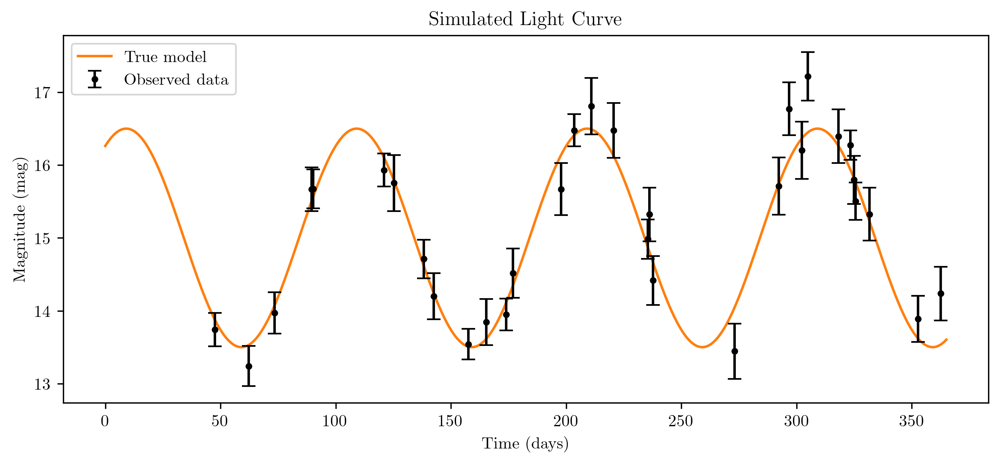

In [77]:
plt.figure(figsize=(10, 4))

plt.plot(x_model, y_model, label='True model', color='tab:orange')
plt.errorbar(t, m_obs, yerr=sigma, fmt='.', label='Observed data', color='k', capsize=4)

plt.xlabel('Time (days)')
plt.ylabel('Magnitude (mag)')
plt.title('Simulated Light Curve')
plt.legend()
plt.show()

In [78]:
# Bayesian inference functions for UltraNest sampler
def prior_transform_lightcurve(cube):
    """Transform unit cube to uniform prior space.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros_like(cube)
    for i, (pmin, pmax) in enumerate(param_ranges):
        params[i] = pmin + (pmax - pmin) * cube[i]
    return params

def log_likelihood_lightcurve(params):
    """Compute the log-likelihood of the observed data given the model parameters.
    Args:
        params: array, model parameters [A, T, phi, m0]
    Returns:
        logL: float, log-likelihood value
    """
    A, T, phi, m0 = params
    # NOTE: EDIT below to complete the log-likelihood calculation
    # model magnitudes at observation times
    m_model = A * np.sin(2 * np.pi * t / T + phi) + m0
    # residuals
    resid = m_obs - m_model
    # Gaussian log-likelihood with heteroscedastic errors
    const = -0.5 * np.sum(np.log(2 * np.pi * sigma**2))
    chi2 = -0.5 * np.sum((resid / sigma)**2)
    logL = const + chi2
  
    return logL

In [79]:
# Create and run the UltraNest sampler
from ultranest import ReactiveNestedSampler
from ultranest.plot import cornerplot

# Directory for saving results
log_dir = 'lightcurve'

# Initialize the sampler
sampler = ReactiveNestedSampler(
    param_names, log_likelihood_lightcurve,
    prior_transform_lightcurve, log_dir=log_dir
)  # Add resume=True if needed

# Run the sampler
results = sampler.run()

Creating directory for new run lightcurve/run1


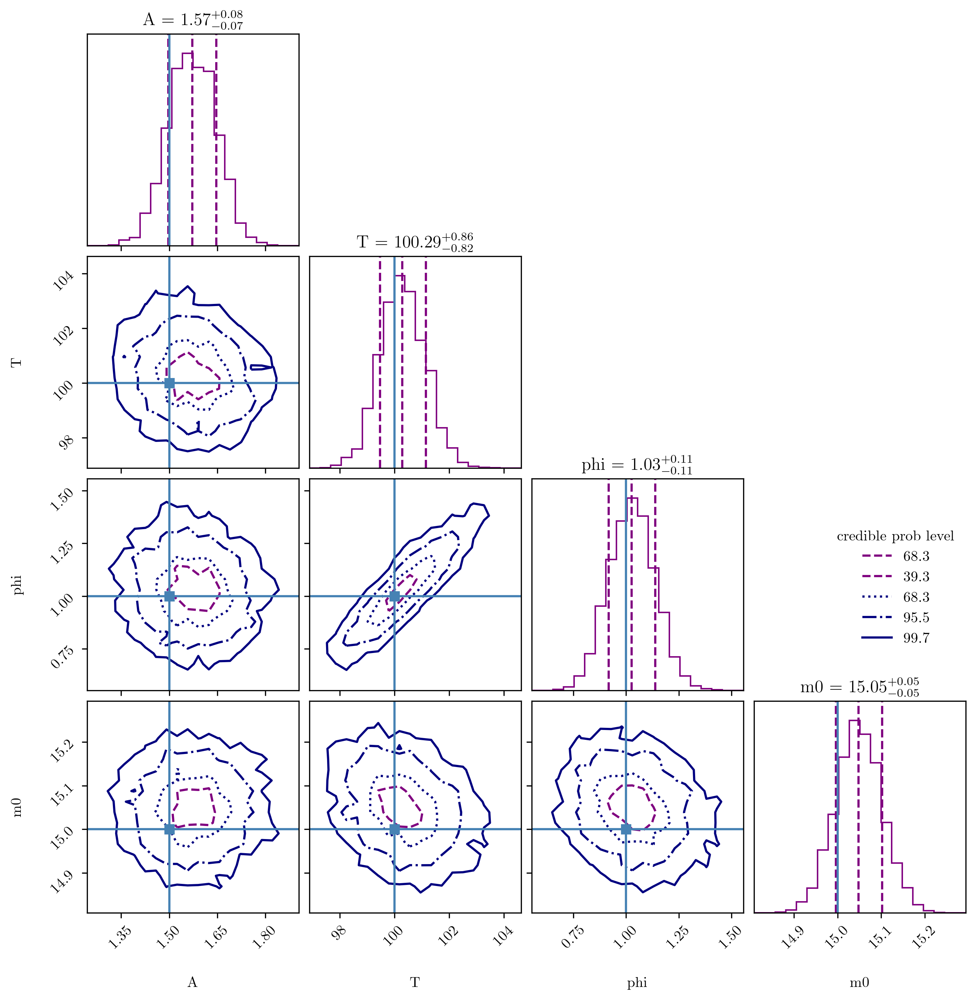

In [80]:
# Create corner plot of the results
cornerplot(results, truths=param_true)
pass

In [81]:
# Report summary statistics
df = pd.DataFrame(data=results['samples'], columns=results['paramnames'])
df.describe(percentiles=[0.16, 0.5, 0.84])

,A,T,phi,m0
count,8559.000000,8559.000000,8559.000000,8559.000000
mean,1.571754,100.297697,1.027605,15.048364
std,0.074260,0.830979,0.110257,0.053563
min,1.243882,97.592807,0.593769,14.821707
16%,1.497936,99.480002,0.916858,14.995999
50%,1.571524,100.293845,1.026627,15.047686
84%,1.646535,101.150908,1.137494,15.102016
max,1.852623,103.807809,1.478882,15.227167


In [82]:
# Compute the covariance matrix from the samples
names   = results['paramnames']
samples = results['samples']

df  = pd.DataFrame(samples, columns=names)
print(df.cov())

            A         T       phi        m0
A    0.005515 -0.009929 -0.000836  0.000162
T   -0.009929  0.690526  0.084081 -0.011616
phi -0.000836  0.084081  0.012157 -0.001130
m0   0.000162 -0.011616 -0.001130  0.002869


#### Question 1.2: inference with emcee

**Task:** Repeat the tasks in Question 1.1 using the `emcee` package.

**Hint:**
1. Plot the chain traces to determine the burn-in period.
2. `emcee` documentation: https://emcee.readthedocs.io/en/stable/tutorials/line/

In [83]:
# Bayesian inference functions for emcee
def log_prior_lightcurve_emcee(params, param_ranges=param_ranges):
    """Compute the log-prior for emcee sampler.
    Args:
        params: array, model parameters [A, T, phi, m0]
        param_ranges: list of tuples, parameter ranges
    Returns:
        logP: float, log-prior value
    """
    for i, (pmin, pmax) in enumerate(param_ranges):
        if not (pmin <= params[i] <= pmax):
            return -np.inf
    return 0.0  # uniform prior within the range

def log_posterior_lightcurve_emcee(params):
    """Compute the log-posterior for emcee sampler.
    Args:
        params: array, model parameters [A, T, phi, m0]
    Returns:
        log_post: float, log-posterior value
    """
    lnP = log_prior_lightcurve_emcee(params)
    if not np.isfinite(lnP):
        return -np.inf
    lnL = log_likelihood_lightcurve(params)
    return lnP + lnL

In [84]:
# Setup and run the emcee sampler
import emcee

ndim = len(param_names)
nwalkers = 256
nsteps = 10000

# Initialize walkers in the prior space
rng = np.random.default_rng(seed + 1)
p0 = rng.uniform(low=param_ranges[:, 0], high=param_ranges[:, 1], size=(nwalkers, ndim))

sampler_emcee = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_lightcurve_emcee)
sampler_emcee.run_mcmc(p0, nsteps, progress=True)
pass

100%|██████████| 10000/10000 [00:31<00:00, 321.61it/s]


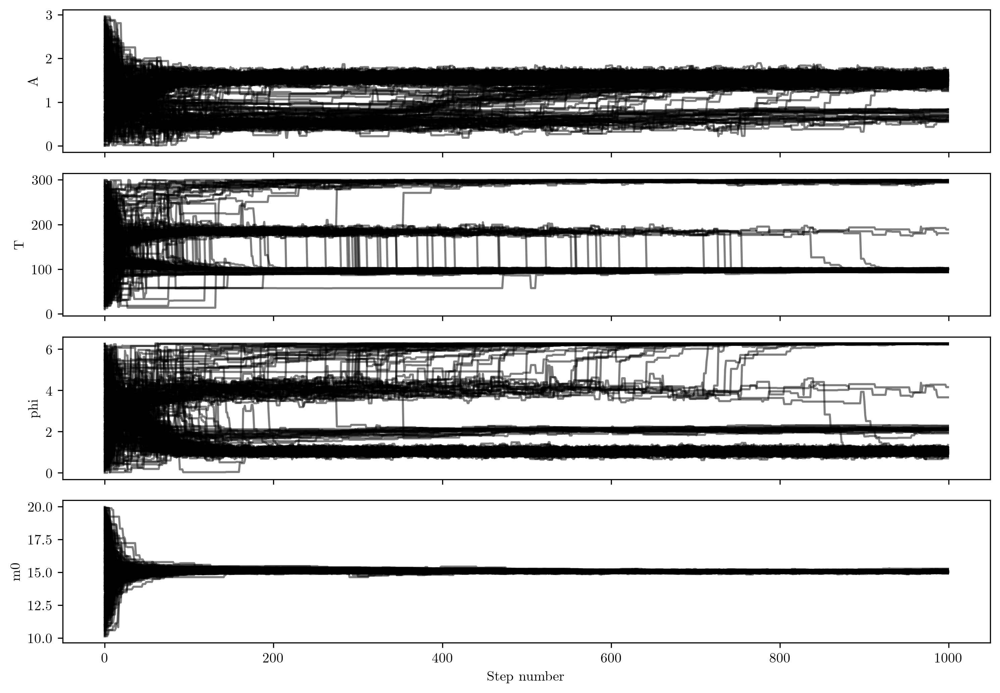

In [85]:
# Plot chain traces
plot_steps = 1000
fig, ax = plt.subplots(ndim, figsize=(10, 7), sharex=True)
samples_emcee = sampler_emcee.get_chain()
for i in range(ndim):
    ax[i].plot(samples_emcee[:plot_steps, :, i], 'k', alpha=0.5)
    ax[i].set_ylabel(param_names[i])

ax[-1].set_xlabel('Step number')
plt.tight_layout()
plt.show()

In [86]:
# Remove burn-in and flatten the chain
# NOTE: EDIT HERE based on the trace plots
burn_in = 1000
flat_samples = sampler_emcee.get_chain(discard=burn_in, flat=True, thin=1)

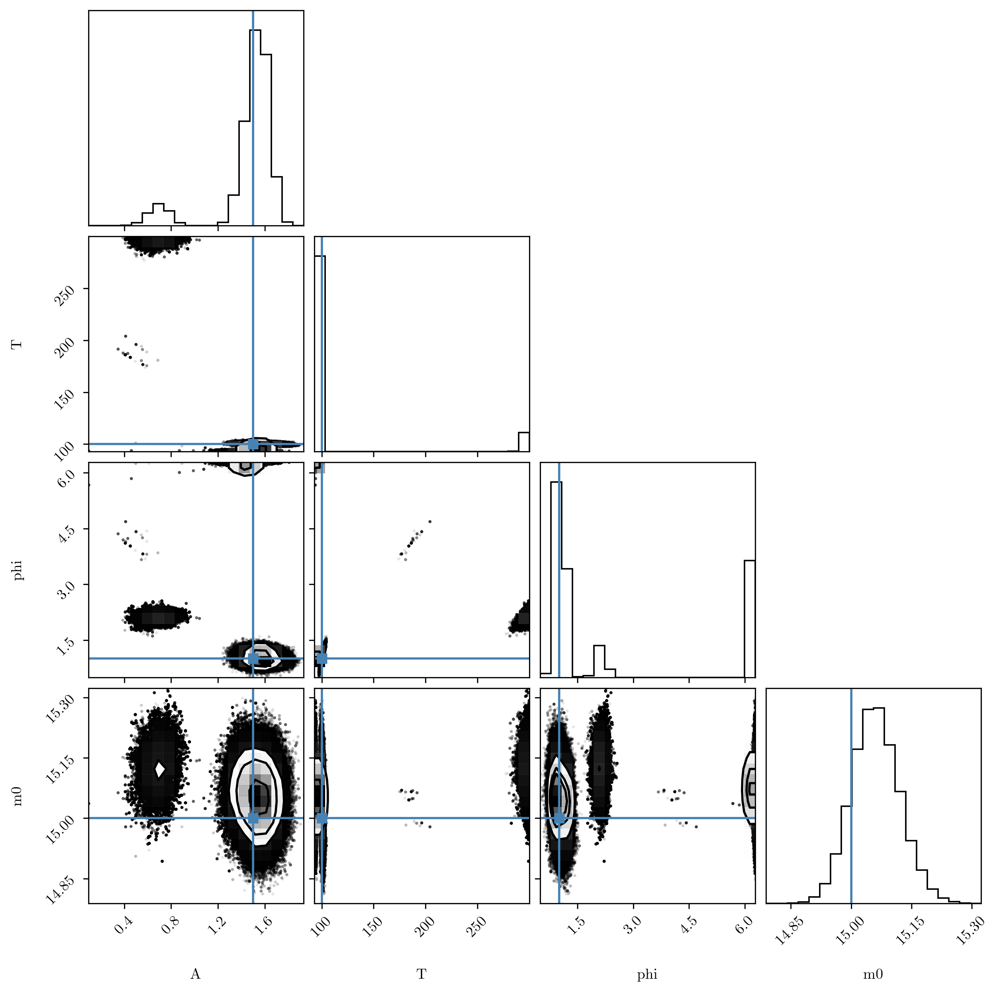

In [87]:
# Make corner plot of the emcee results
import corner

corner.corner(flat_samples, labels=param_names, truths=param_true)
pass

In [88]:
# Report summary statistics
df_emcee = pd.DataFrame(data=flat_samples, columns=param_names)
df_emcee.describe(percentiles=[0.16, 0.5, 0.84])

,A,T,phi,m0
count,2.304000e+06,2.304000e+06,2.304000e+06,2.304000e+06
mean,1.459203e+00,1.164631e+02,2.438643e+00,1.506101e+01
std,2.584358e-01,5.697349e+01,2.236359e+00,5.953490e-02
min,9.394371e-02,9.285106e+01,4.903848e-01,1.478811e+01
16%,1.392486e+00,9.416742e+01,9.489992e-01,1.500236e+01
50%,1.528519e+00,1.000147e+02,1.106681e+00,1.505940e+01
84%,1.623341e+00,1.013543e+02,6.270686e+00,1.512012e+01
max,1.931130e+00,2.999994e+02,6.283184e+00,1.532271e+01


In [89]:
# Report the covariance matrix from emcee samples
print(df_emcee.cov())

             A            T        phi        m0
A     0.066789   -13.552115  -0.098642 -0.005676
T   -13.552115  3245.978907 -11.216066  1.192096
phi  -0.098642   -11.216066   5.001300  0.023258
m0   -0.005676     1.192096   0.023258  0.003544


#### Question 1.3: multimodal posterior?

You may notice a multimodal posterior distribution from the `emcee` results. (If not, try another random seed when simulating the data.)

**Tasks:**
1. Identify a set of parameters corresponding to a different mode in the posterior distribution.
2. Plot the light curve model using these parameters over the simulated data, and compare it with the light curve model using the true parameters.
3. Vary one parameter of this model (such as $\phi$) while keeping other parameters fixed to see how the log-likelihood changes. Plot the log-likelihood as a function of this parameter to illustrate the presence of multiple modes, overlaying the log-likelihood curve from the true parameters for comparison.
4. Discuss all your results in the whole exercise.

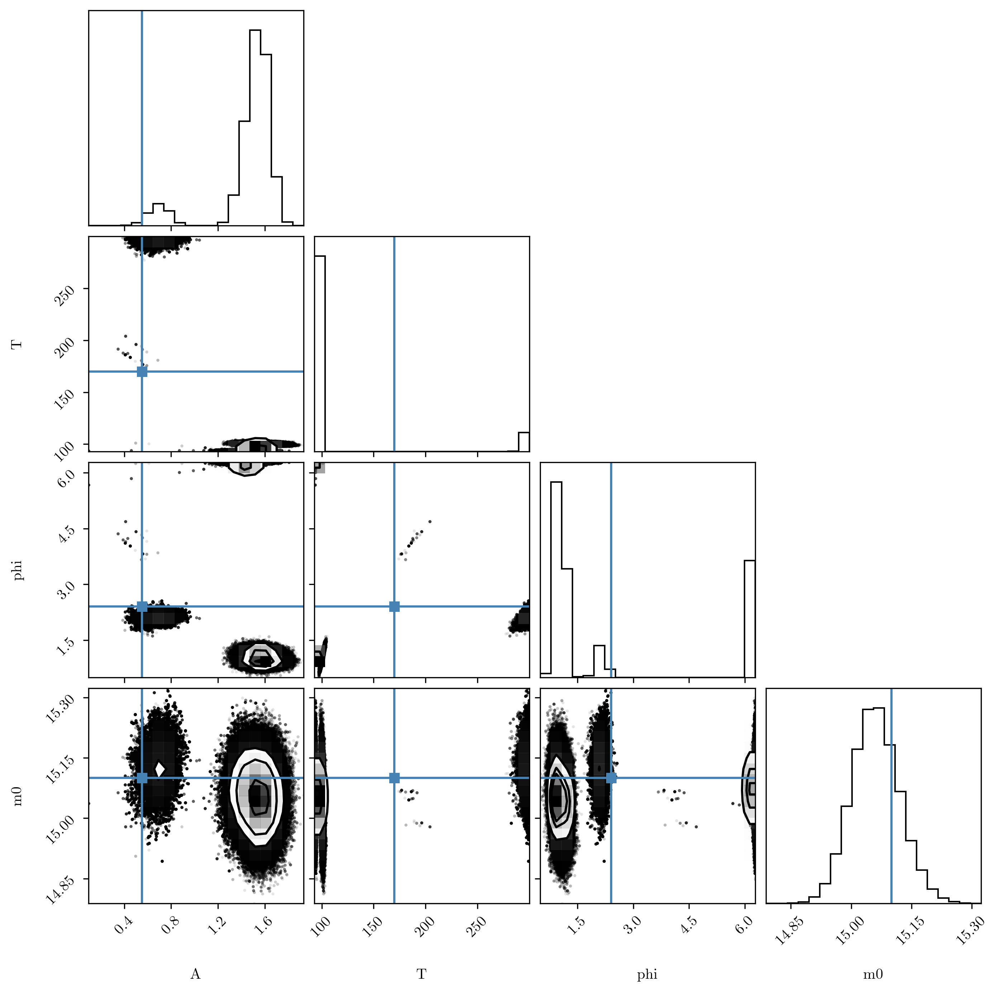

In [90]:
param_secondary = [0.55, 170, 2.4, 15.1]  # NOTE: EDIT HERE to insert parameters of a different mode

# Remake the corner plot to highlight the secondary mode (or to verify if your identified parameters are indeed a different mode)
corner.corner(flat_samples, labels=param_names, truths=param_secondary)
pass

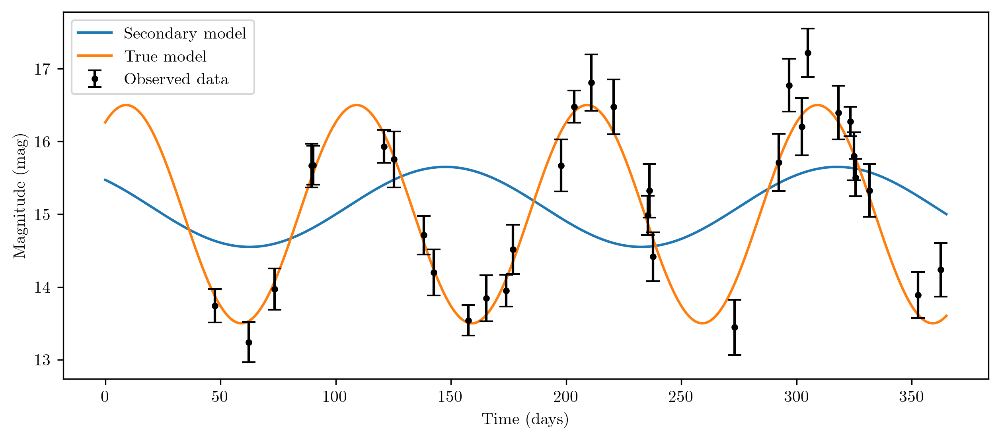

In [91]:
# NOTE: EDIT below to compute the model using the secondary parameters
y_model_secondary = param_secondary[0] * np.sin(2 * np.pi * x_model / param_secondary[1] + param_secondary[2]) + param_secondary[3]

plt.figure(figsize=(10, 4))
plt.plot(x_model, y_model_secondary, label='Secondary model', color='tab:blue')
plt.plot(x_model, y_model, label='True model', color='tab:orange')
plt.errorbar(t, m_obs, yerr=sigma, fmt='.', label='Observed data', color='k', capsize=4)

# NOTE: EDIT below to plot the model using the secondary parameters

plt.xlabel('Time (days)')
plt.ylabel('Magnitude (mag)')
plt.legend()
plt.show()

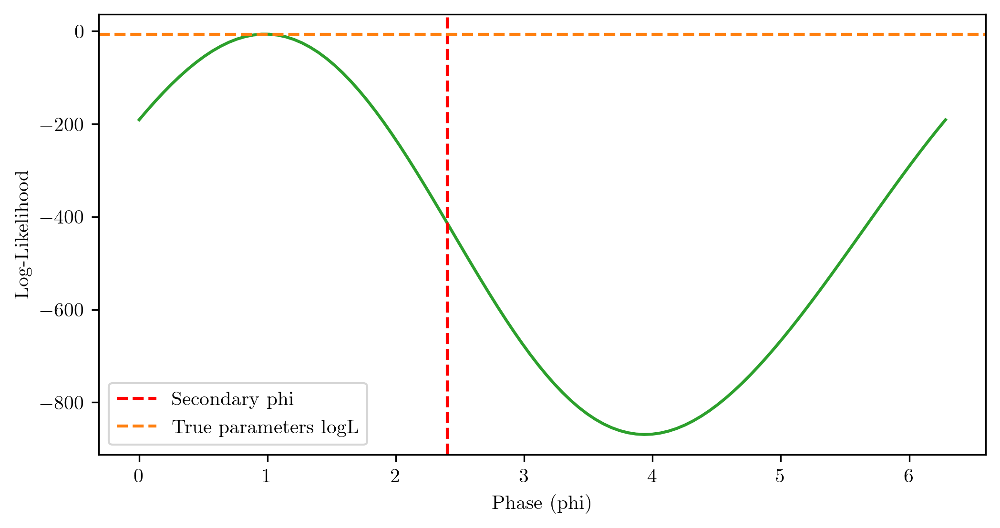

In [92]:
loglike_true = log_likelihood_lightcurve(param_true)

# NOTE: feel free to scan over another parameter
phi_values = np.linspace(0, 2 * np.pi, 100)
# NOTE: EDIT below to compute log-likelihood values over phi_values
loglike_phi = np.array([log_likelihood_lightcurve([param_true[0], param_true[1], phi, param_true[3]]) 
                        for phi in phi_values])

plt.figure(figsize=(8, 4))

plt.plot(phi_values, loglike_phi, color='tab:green')
plt.axvline(param_secondary[2], color='r', linestyle='--', label='Secondary phi')
plt.axhline(loglike_true, color='tab:orange', linestyle='--', label='True parameters logL')

plt.xlabel('Phase (phi)')
plt.ylabel('Log-Likelihood')
plt.legend()
plt.show()

##### Discussions

在使用上还是可以明显地感受到 emcee 算法和 UltraNest 的差异，emcee 容易在 burn-in 比较少、步长比较短的情况下陷入某一个区间内，UltraNest 在这个方面的表现比 emcee 强了很多；另外，emcee 的可调参数更多，虽然在这个问题中没有产生什么特别的影响，但是应该会在某些比较特殊的情况下展现敏感的特征.

### Exercise 2: spectral line fitting

Let us revisit the spectral line problem with the following model (expected photon counts as a function of wavelength channel x):

$N_{\rm exp} (x) = A \exp \left[-\dfrac{(x - x_0)^2}{2 w^2}\right] + B$

where $A$ is the amplitude of the Gaussian line, $x_0$ is the center of the line, $w$ is the width of the line, and $B$ is the constant background level.

The data is taken on integer $x_i \in [-25, 25]$ with 51 wavelength channels. The observed photon counts $n_i$ are generated by drawing from a Poisson distribution with mean $N_{\rm exp}(x_i)$.

Now, with the nested sampling method, we are able to infer all parameters simultaneously.

#### Question 2.1: inference of all parameters

**Tasks:**
1. Simulate the spectral line data $\{x_i, n_i\}$ using the following parameters: $A=B=50, x_0=0, w=5$. Plot the simulated spectral line data, and overlay the true spectral line model.
2. Infer parameters $(A, w, B, x_0)$ using the `UltraNest` package with uniform priors over the following ranges:
   - $A \in [0, 100]$
   - $x_0 \in [-10, 10]$
   - $w \in [1, 20]$
   - $B \in [0, 100]$
3. Plot the joint and marginalized posterior distributions of the parameters, along with two additional derived parameters: the galaxy star formation rate $f = A w / 10$ and velocity dispersion $\sigma_v = 10 * w$.
4. Report the mean, standard deviation, and 16-50-84 percentiles of the marginalized posterior distributions, as well as the covariance matrix of the joint posterior distribution (including the derived parameters). Present also the correlation matrix.


In [93]:
def spec_model(x, A, w, B, x0=0):
    """Model (expected) photon counts of a galaxy spectrum with a Gaussian line plus constant background.
    Args:
        x: array-like, wavelengths
        A: float, line amplitude
        w: float, line width (standard deviation)
        B: float, background level
        x0: float, line center (default: 0)
    Return: numpy array, expected photon counts at each wavelength
    """
    n = [A * np.exp(- (xi - x0)**2 / (2 * w**2)) + B for xi in x]
    return np.array(n)

def sim_spec(A, w, B, x0=0, seed=42):
    """Simulate a galaxy spectrum with given background and line width.
    Args:
        A: float, line amplitude
        w: float, line width (standard deviation)
        B: float, background level
        x0: float, line center (default: 0)
        seed: int, random seed for reproducibility (default: 42)
    Returns:
        x: numpy array, wavelengths
        n_obs: numpy array, observed photon counts at each wavelength
    """
    x = np.arange(-25, 26, 1)  # Wavelengths from -25 to 25
    rng = np.random.default_rng(seed)
    N_exp = spec_model(x, A, w, B, x0)
    # ensure non-negative expected counts
    N_exp = np.clip(N_exp, 0, None)
    n_obs = rng.poisson(N_exp)
    return x, n_obs

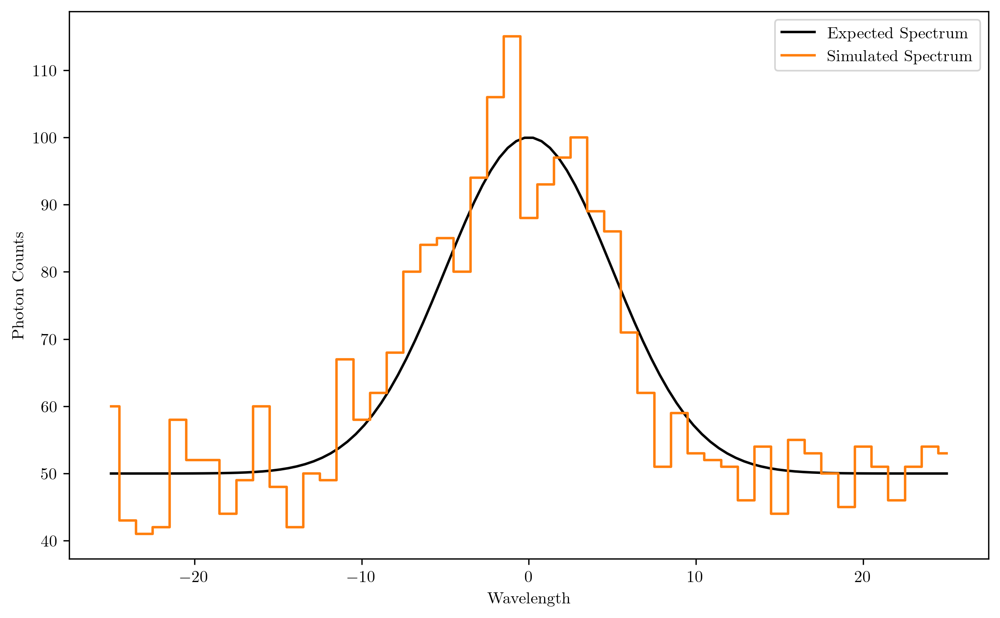

In [ ]:
# Set the random seed
seed = 2024011182

# Parameter setup
param_names = ['A', 'w', 'B', 'x0']
npar = len(param_names)
param_true = [50, 5, 50, 0]
param_ranges = np.array([(0, 100), (1, 20), (0, 100), (-10, 10)])
# Define derived parameters
derived_names = ['f', 'sigma_v']
derived_true = [25, 50]

# Simulate the spectrum
x_spec, spec = sim_spec(*(param_true[:npar]), seed=seed)

# Compute the expected spectrum with true parameters for comparison
x_model = np.linspace(-25, 25, 100)
y_model = spec_model(x_model, *(param_true[:npar]))

# Plot the model and simulated spectrum
plt.figure(figsize=(10, 6))
plt.plot(x_model, y_model, label='Expected Spectrum', color='k')
plt.plot(x_spec, spec, drawstyle='steps-mid', label='Simulated Spectrum', color='tab:orange')
plt.xlabel('Wavelength')
plt.ylabel('Photon Counts')
plt.legend()
plt.show()

In [95]:
# Bayesian inference functions for UltraNest sampler
from scipy.special import gammaln, xlogy

def prior_transform_spec(cube):
    """Transform unit cube to uniform prior space.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros(npar + len(derived_names))
    for i, (pmin, pmax) in enumerate(param_ranges[:npar]):
        params[i] = pmin + (pmax - pmin) * cube[i]
    # derived parameters
    params[npar] = params[0] * params[1] / 10   # f = A * w / 10
    params[npar + 1] = params[1] * 10           # sigma_v = w * 10
    return params

def log_likelihood_spec(params, spec_data):
    """Compute the log-likelihood of the observed data given the model parameters.
    Args:
        params: array, model parameters [A, w, B, x0]
    Returns:
        logL: float, log-likelihood value
    """
    N_exp = spec_model(x_spec, *(params[:npar]))
    const_term = -np.sum(gammaln(spec_data + 1))  # log(factorial(spec))
    logL = np.sum(xlogy(spec_data, N_exp) - N_exp) + const_term  # Complete Poisson log-likelihood
    return logL

In [96]:
import logging

# Create and run the UltraNest sampler for the spectrum
log_dir = 'spectrum'

# Use extended parameter names including derived parameters so prior_transform_spec returns the expected shape
param_names_extended = param_names + derived_names

# Create the sampler with the extended parameter list (log_likelihood_spec uses only the first npar entries)
logging.getLogger('ultranest').setLevel(logging.WARNING)

sampler_spec = ReactiveNestedSampler(
    param_names_extended,
    lambda p: log_likelihood_spec(p, spec),
    prior_transform_spec,
    log_dir=log_dir
)

results_spec = sampler_spec.run()

Creating directory for new run spectrum/run1


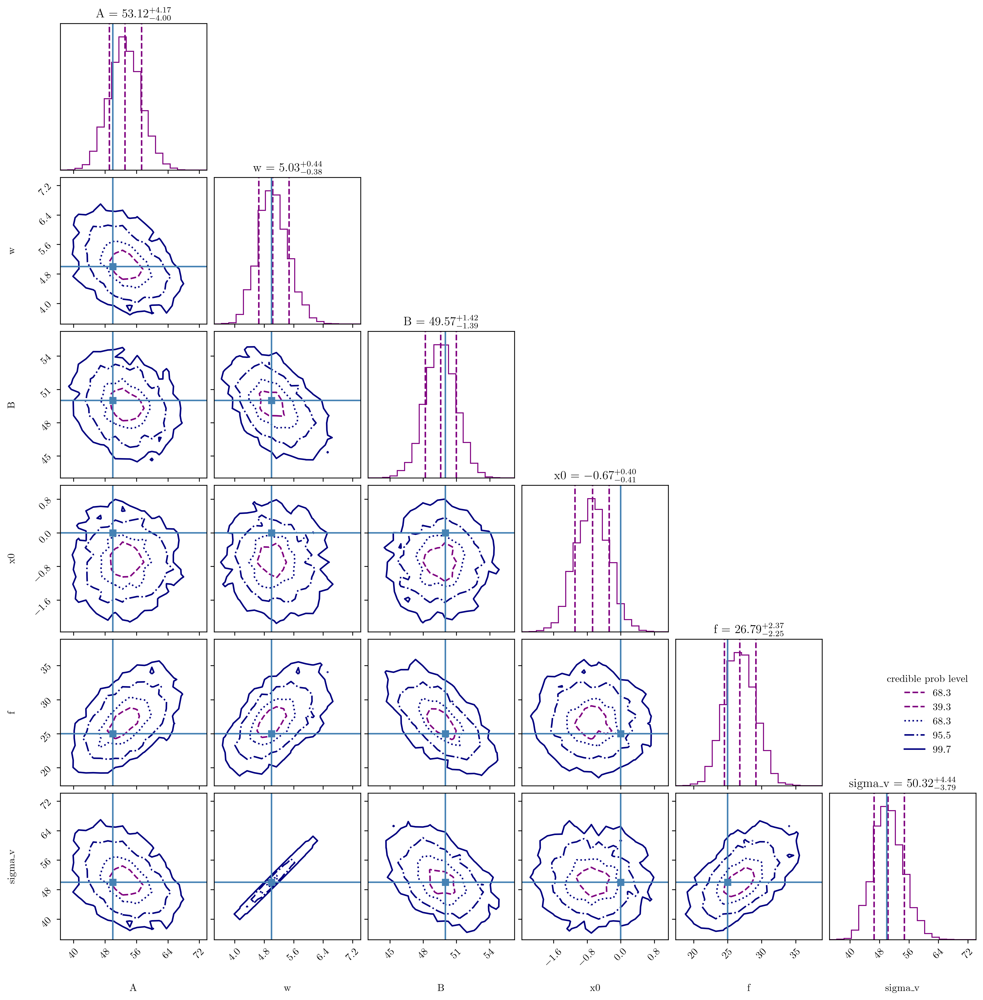

In [97]:
# Plot a joint corner plot of all parameters (including derived ones)
cornerplot(results_spec, truths=param_true+derived_true)
pass

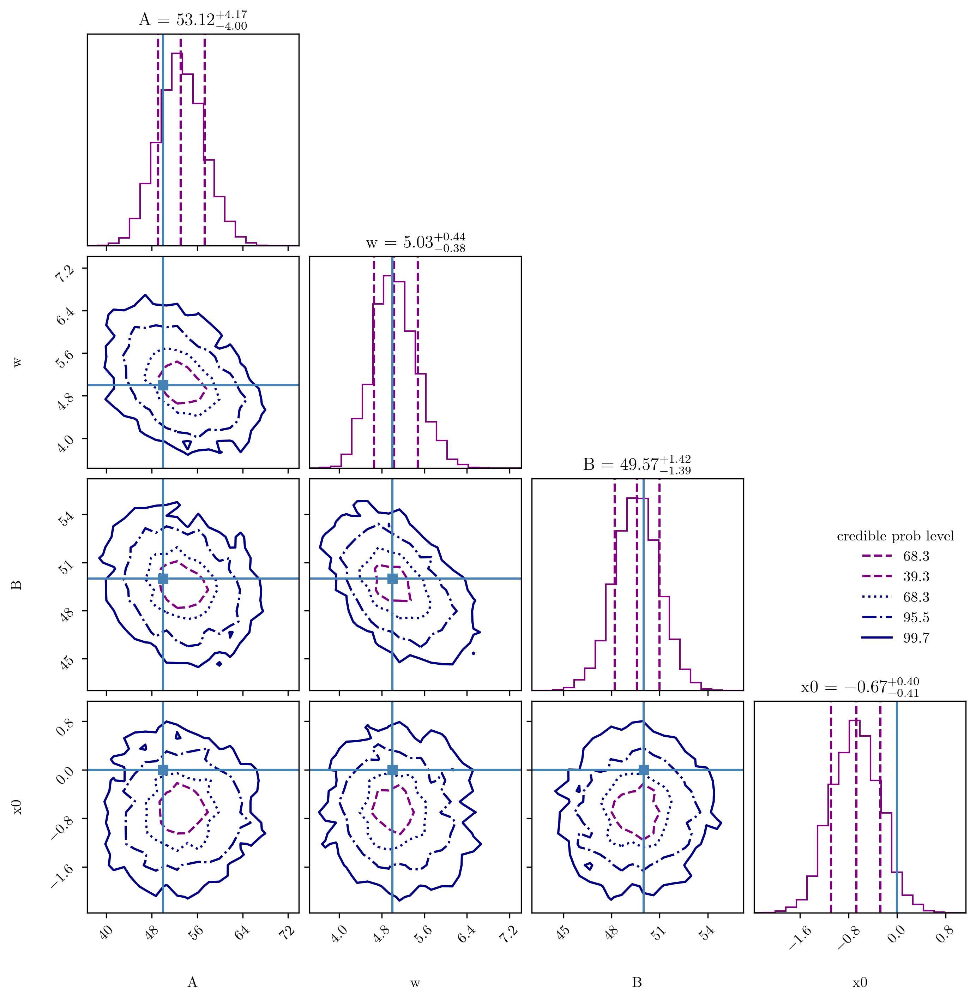

In [98]:
# Or, only the fitting parameters
results_spec_fitting = {
    'paramnames': param_names,
    'weighted_samples': {
        'points': results_spec['weighted_samples']['points'][:, :npar],
        'weights': results_spec['weighted_samples']['weights']
    }
}
cornerplot(results_spec_fitting, truths=param_true)
pass

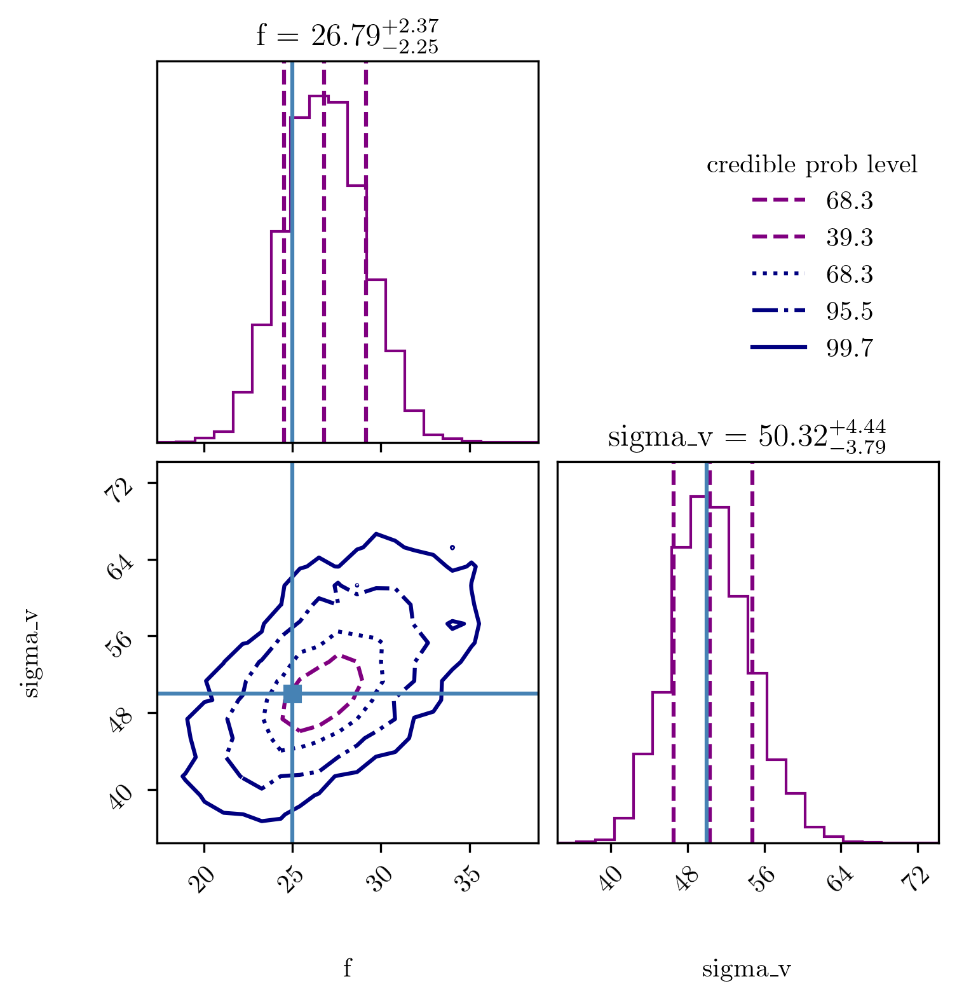

In [99]:
# Now, only the derived parameters
results_spec_derived  = {
    'paramnames': derived_names,
    'weighted_samples': {
        'points': results_spec['weighted_samples']['points'][:, npar:],
        'weights': results_spec['weighted_samples']['weights']
    }
}
cornerplot(results_spec_derived, truths=derived_true)
pass

In [100]:
# Report summary statistics
df = pd.DataFrame(data=results_spec['samples'], columns=results_spec['paramnames'])
df.describe(percentiles=[0.16, 0.5, 0.84])

,A,w,B,x0,f,sigma_v
count,7052.000000,7052.000000,7052.000000,7052.000000,7052.000000,7052.000000
mean,53.173646,5.054177,49.578374,-0.677938,26.803082,50.541767
std,4.111417,0.414249,1.419082,0.396803,2.289915,4.142488
min,38.351440,3.551228,43.825676,-2.267202,19.352341,35.512277
16%,49.137275,4.653106,48.189423,-1.085254,24.565140,46.531061
50%,53.095035,5.032934,49.574951,-0.674146,26.789800,50.329342
84%,57.255888,5.475386,50.985784,-0.273479,29.122467,54.753863
max,71.934736,6.822641,55.657426,0.797904,36.536861,68.226411


In [101]:
# Compute the covariance matrix from the samples
names   = results_spec['paramnames']
samples = results_spec['samples']

df  = pd.DataFrame(samples, columns=names)
print(df.cov())     # Covariance matrix of all parameters
print(df.corr())    # Correlation matrix of all parameters

                 A         w         B        x0         f    sigma_v
A        16.903752 -0.718286 -1.202569  0.039755  4.687962  -7.182861
w        -0.718286  0.171602 -0.284156 -0.013945  0.543687   1.716021
B        -1.202569 -0.284156  2.013793  0.023001 -2.106028  -2.841558
x0        0.039755 -0.013945  0.023001  0.157452 -0.051990  -0.139451
f         4.687962  0.543687 -2.106028 -0.051990  5.243710   5.436873
sigma_v  -7.182861  1.716021 -2.841558 -0.139451  5.436873  17.160209
                A         w         B        x0         f   sigma_v
A        1.000000 -0.421740 -0.206116  0.024368  0.497936 -0.421740
w       -0.421740  1.000000 -0.483379 -0.084837  0.573150  1.000000
B       -0.206116 -0.483379  1.000000  0.040847 -0.648093 -0.483379
x0       0.024368 -0.084837  0.040847  1.000000 -0.057217 -0.084837
f        0.497936  0.573150 -0.648093 -0.057217  1.000000  0.573150
sigma_v -0.421740  1.000000 -0.483379 -0.084837  0.573150  1.000000


#### Question 2.2: line identification via Bayesian model comparison

**Tasks:**
1. Consider an alternative model without the Gaussian line component: $N_{\rm exp} (x) = B$. Using the same simulated data from Question 2.1, compute the Bayesian evidence for both models (with and without the Gaussian line) using `UltraNest`.
2. Compute the Bayes factor to compare the two models.

In [102]:
def prior_transform_spec_no_line(cube):
    """Transform unit cube to uniform prior space for model without line.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros(1)  # Only one parameter: B
    pmin, pmax = param_ranges[2]  # Range for B
    params[0] = pmin + (pmax - pmin) * cube[0]
    return params

def log_likelihood_spec_no_line(params, spec):
    """Compute the log-likelihood of the observed data given the model parameters for model without line.
    Args:
        params: array, model parameters [B]
    Returns:
        logL: float, log-likelihood value
    """
    B = params[0]
    # NOTE: EDIT below to complete the log-likelihood calculation
    # model: constant background B for all wavelength channels
    N_exp = np.full_like(spec, float(B), dtype=float)
    # Poisson log-likelihood: sum( n * log(lambda) - lambda - log(n!) )
    const_term = -np.sum(gammaln(spec + 1))
    logL = np.sum(xlogy(spec, N_exp) - N_exp) + const_term
    return logL

In [103]:
# Create and run the UltraNest sampler for the model without line
log_dir = 'spectrum_no_line'

# Parameter names for the no-line model (only background B)
param_names_no_line = ['B']

# Create the sampler using the single-parameter prior transform
sampler_spec_no_line = ReactiveNestedSampler(
    param_names_no_line,
    lambda p: log_likelihood_spec_no_line(p, spec),
    prior_transform_spec_no_line,
    log_dir=log_dir
)

results_spec_no_line = sampler_spec_no_line.run()

Creating directory for new run spectrum_no_line/run1


In [104]:
# NOTE: EDIT below to compute the log Bayes factor for the two models
# UltraNest returns log-evidence in 'logz', so the log Bayes factor is simply the difference.
logz_with_line = results_spec['logz']
logz_without_line = results_spec_no_line['logz']
log_bayes_factor = logz_with_line - logz_without_line
print(f'Log Bayes Factor (with line vs without line): {log_bayes_factor:.2f}')

Log Bayes Factor (with line vs without line): 112.68


#### Question 2.3: calibration systematics

Assume that there is a uncalibrated wavelength-dependent instrument background that introduces a linear systematic bias in the expected photon counts:

$N'_{\rm exp} (x) = A \exp \left[ - \dfrac{(x-x_0)^2}{2 w^2} \right] + B + kx + b$

where $k$ is the slope of the calibration bias, $b$ is the intercept.

**Tasks:**
1. Re-simulate the spectral line data from Question 2.1 with a calibration bias with $k=0.6$ and $b=10$. Plot the biased spectral line data, and overlay the true spectral line model (without calibration bias).
2. Repeat the inference from Question 2.1 without accounting for the calibration bias. Plot the joint and marginalized posterior distributions of the parameters, and report the summary statistics as before.

In [105]:
def sim_spec_biased(A, w, B, x0, k, b, seed=42):
    """Simulate a galaxy spectrum with calibration bias.
    Args:
        A: float, line amplitude
        w: float, line width (standard deviation)
        B: float, background level
        x0: float, line center
        k: float, calibration bias slope
        b: float, calibration bias intercept
        seed: int, random seed for reproducibility (default: 42)
    Returns:
        x: numpy array, wavelengths
        n_obs_biased: numpy array, observed photon counts with calibration bias
    """
    x = np.arange(-25, 26, 1)  # Wavelengths from -25 to 25
    # NOTE: EDIT below to simulate observed photon counts with calibration bias
    rng = np.random.default_rng(seed)
    N_exp = spec_model(x, A, w, B, x0)
    # apply linear calibration bias k*x + b
    N_exp_biased = N_exp + k * x + b
    # ensure non-negative expected counts
    N_exp_biased = np.clip(N_exp_biased, 0, None)
    n_obs_biased = rng.poisson(N_exp_biased)
    return x, n_obs_biased

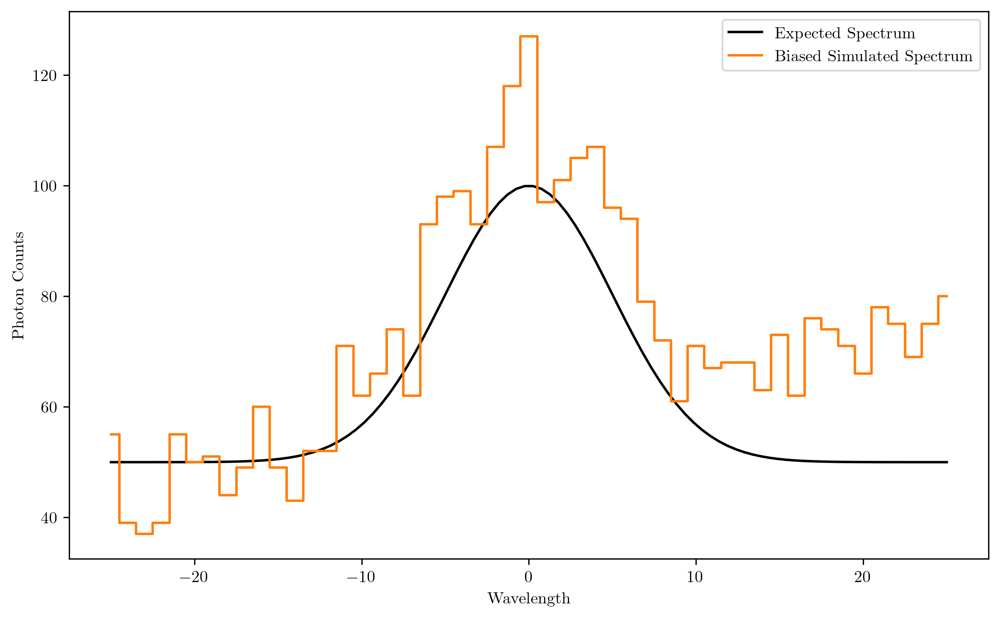

In [106]:
k_true = 0.6
b_true = 10
x_spec, spec_biased = sim_spec_biased(*(param_true), k_true, b_true, seed=seed)

plt.figure(figsize=(10, 6))
plt.plot(x_model, y_model, label='Expected Spectrum', color='k')
plt.plot(x_spec, spec_biased, drawstyle='steps-mid', label='Biased Simulated Spectrum', color='tab:orange')
plt.xlabel('Wavelength')
plt.ylabel('Photon Counts')
plt.legend()
plt.show()

In [107]:
# Create and run the UltraNest sampler for the model with calibration systematics
log_dir = 'spectrum_biased'

param_names_calibration = param_names_extended

# NOTE: EDIT below to create the sampler
sampler_biased = ReactiveNestedSampler(
    param_names_calibration,
    lambda p: log_likelihood_spec(p, spec_biased),
    prior_transform_spec,
    log_dir=log_dir
)

results_spec_biased = sampler_biased.run()

Creating directory for new run spectrum_biased/run1


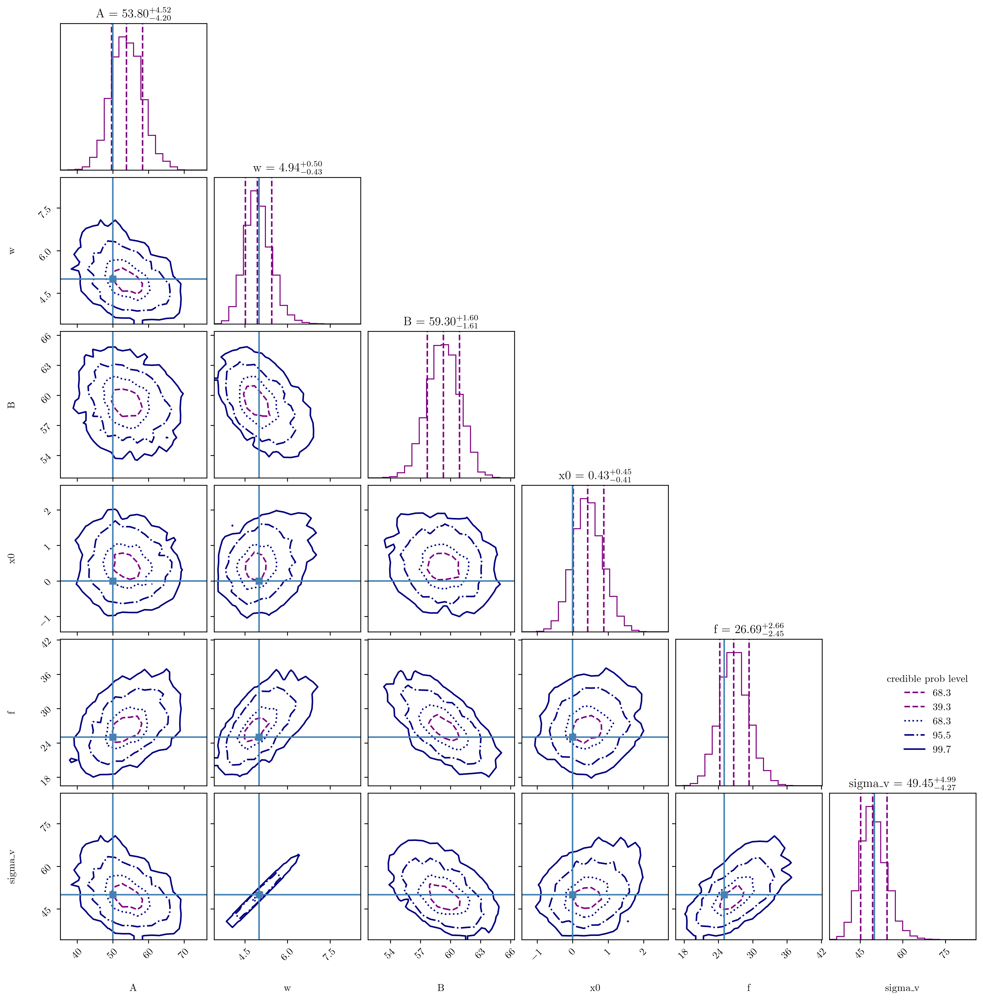

In [108]:
cornerplot(results_spec_biased, truths=param_true+derived_true)
pass

In [109]:
# NOTE: EDIT below to report summary statistics
# Report summary statistics for the calibration run (fall back to other spectrum results if not present)
res = globals().get('results_spec_calib') or globals().get('results_spec_biased') or globals().get('results_spec')

if res is None:
    print('No UltraNest results found (results_spec_calib / results_spec_biased / results_spec).')
else:
    names = res['paramnames']
    samples = res['samples']
    df_res = pd.DataFrame(samples, columns=names)

    print("Summary statistics (including 16/50/84 percentiles):")
    display(df_res.describe(percentiles=[0.16, 0.5, 0.84]))

    print("\nCovariance matrix:")
    print(df_res.cov())

    print("\nCorrelation matrix:")
    print(df_res.corr())

    if 'logz' in res:
        print(f"\nLog-evidence (logZ): {res['logz']:.6g}  ± {res.get('logzerr', np.nan):.6g}")

Summary statistics (including 16/50/84 percentiles):


,A,w,B,x0,k,b,f,sigma_v
count,7856.000000,7856.000000,7856.000000,7856.000000,7856.000000,7856.000000,7856.000000,7856.000000
mean,54.036501,4.925338,49.514879,-0.448873,0.602944,9.926886,26.543273,49.253384
std,4.303335,0.424247,6.042962,0.417749,0.074478,5.864554,2.428798,4.242473
min,37.859757,3.425318,34.411649,-1.859683,0.332806,0.001669,18.212377,34.253178
16%,49.894924,4.512572,42.513046,-0.866398,0.528912,3.035516,24.143715,45.125722
50%,54.060301,4.912948,49.674264,-0.451749,0.599592,9.696400,26.532078,49.129480
84%,58.292784,5.343534,56.367189,-0.029606,0.677626,16.954213,28.891584,53.435342
max,72.065143,7.187090,62.989378,1.142170,0.839028,19.998368,36.619236,71.870904



Covariance matrix:
                 A         w          B        x0         k          b  \
A        18.518693 -0.715416  -1.727820  0.031441 -0.026578   0.087038   
w        -0.715416  0.179986  -0.356649 -0.007555 -0.000865   0.039035   
B        -1.727820 -0.356649  36.517388  0.072025  0.014969 -34.223010   
x0        0.031441 -0.007555   0.072025  0.174514 -0.007802  -0.050074   
k        -0.026578 -0.000865   0.014969 -0.007802  0.005547   0.004398   
b         0.087038  0.039035 -34.223010 -0.050074  0.004398  34.392993   
f         5.256054  0.612783  -2.798292 -0.025257 -0.017789   0.271583   
sigma_v  -7.154155  1.799857  -3.566488 -0.075550 -0.008647   0.390351   

                f    sigma_v  
A        5.256054  -7.154155  
w        0.612783   1.799857  
B       -2.798292  -3.566488  
x0      -0.025257  -0.075550  
k       -0.017789  -0.008647  
b        0.271583   0.390351  
f        5.899059   6.127828  
sigma_v  6.127828  17.998575  

Correlation matrix:
             

#### Question 2.4: accounting for calibration systematics

Now, assume that the calibration bias is noticed but the exact form is unknown. One way to account for this issue is to introduce additional nuisance parameters $k$ and $b$ in the model to capture the calibration bias.

**Tasks:**
1. Repeat the inference from Question 2.1, now including the nuisance parameters $k$ and $b$ in the model. Use uniform priors for $k \in [-1, 1]$ and $b \in [0, 20]$.
2. Plot the joint and marginalized posterior distributions of all parameters, including $k$ and $b$.
3. Report the mean, standard deviation, and 16-50-84 percentiles of the marginalized posterior distributions, as well as the covariance matrix of the joint posterior distribution (including the nuisance parameters). Compare the evidence with that from Question 2.3 (without the nuisance parameters).
4. Do you really need the $b$ parameter in the model? Try removing it and see how the inference results and evidence change.
5. Discuss all your results in the whole exercise.

In [110]:
param_names_calib = param_names + ['k', 'b']
npar_calib = len(param_names_calib)
param_ranges_calib = np.concatenate((param_ranges, np.array([(-1, 1), (0, 20)])))
param_true_calib = param_true + [k_true, b_true]

In [111]:
def prior_transform_spec_calib(cube):
    """Transform unit cube to uniform prior space with calibration parameters.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros(npar_calib + 2)   # Derived parameters: f, sigma_v
    for i, (pmin, pmax) in enumerate(param_ranges_calib):
        params[i] = pmin + (pmax - pmin) * cube[i]
    # Derived parameters
    params[npar_calib] = params[0] * params[1] / 10   # f = A * w / 10
    params[npar_calib + 1] = params[1] * 10           # sigma_v = w * 10
    return params

def log_likelihood_spec_calib(params):
    """Compute the log-likelihood of the observed data given the model parameters with calibration bias.
    Args:
        params: array, model parameters [A, w, B, x0, k, b]
    Returns:
        logL: float, log-likelihood value
    """
    k = params[npar]
    b = params[npar + 1]
    # NOTE: EDIT below to complete the log-likelihood calculation
    # expected counts: Gaussian line + background + linear calibration bias
    N_exp = spec_model(x_spec, *(params[:npar])) + k * x_spec + b
    # avoid non-positive expected counts for log calculations
    N_exp = np.clip(N_exp, 1e-10, None)
    # Poisson log-likelihood: sum( n*log(lambda) - lambda - log(n!) )
    const_term = -np.sum(gammaln(spec + 1))
    logL = np.sum(xlogy(spec, N_exp) - N_exp) + const_term
    return logL

In [112]:
# Create and run the UltraNest sampler for the model with calibration parameters
log_dir = 'spectrum_calib'

# Make sure the sampler's parameter names match what prior_transform_spec_calib returns.
# prior_transform_spec_calib returns [A, w, B, x0, k, b, f, sigma_v] (npar_calib + 2)
param_names_calib_extended = param_names_calib + ['f', 'sigma_v']

# Use the biased observed spectrum as the global 'spec' that log_likelihood_spec_calib expects
spec = spec_biased

# Create the sampler using the extended parameter names
sampler_calib = ReactiveNestedSampler(
    param_names_calib_extended,
    lambda p: log_likelihood_spec_calib(p),
    prior_transform_spec_calib,
    log_dir=log_dir
)

results_spec_calib = sampler_calib.run()

Creating directory for new run spectrum_calib/run1


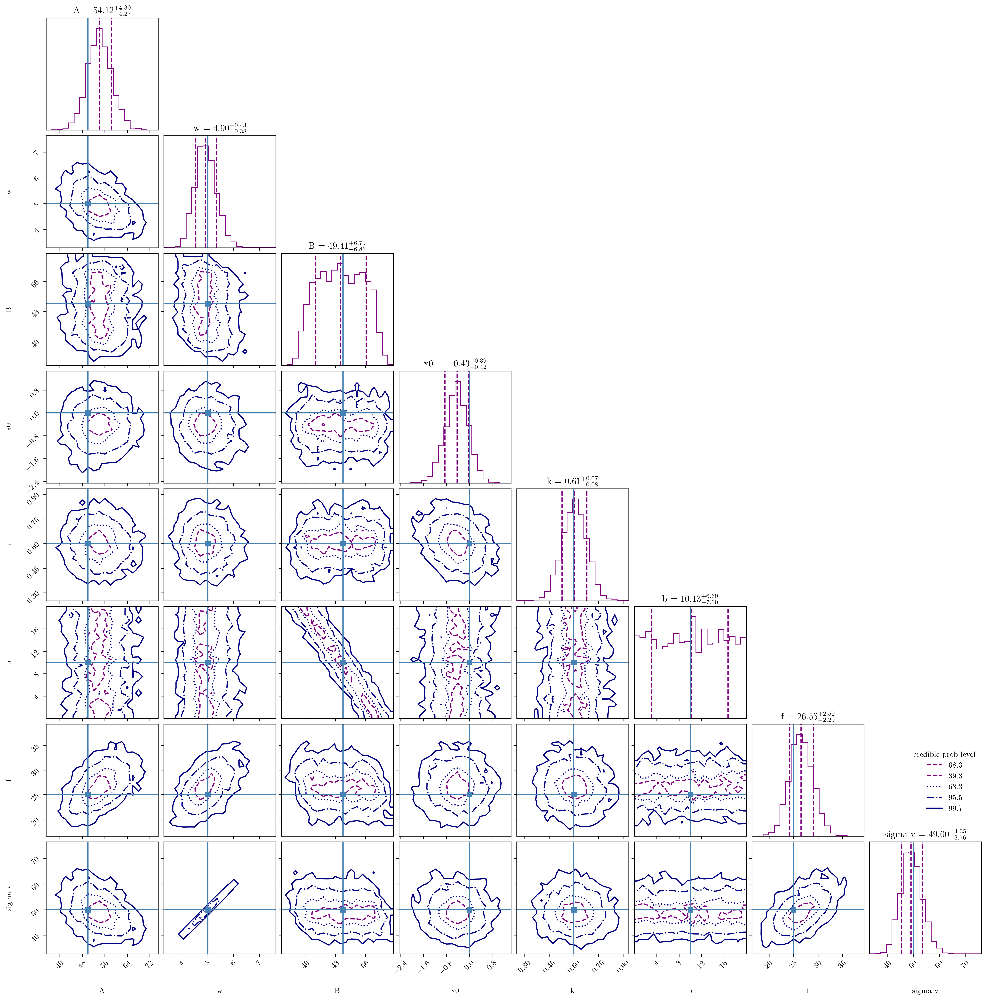

In [113]:
# NOTE: EDIT below to make the corner plot with derived parameters
cornerplot(results_spec_calib, truths=param_true_calib + derived_true)
pass

In [114]:
# NOTE: EDIT below to report summary statistics

# Use the 'results' produced by UltraNest (light curve)
names = results['paramnames']
samples = results['samples']

# Convert to DataFrame for easy summary
df_res = pd.DataFrame(samples, columns=names)

# Basic info
print(f"Number of posterior samples: {df_res.shape[0]}")
if 'logz' in results:
    print(f"Log-evidence (logZ): {results['logz']:.6g}  ± {results.get('logzerr', np.nan):.6g}")
print()

# Standard descriptive summary including 16/50/84 percentiles
print("Descriptive statistics (including 16/50/84 percentiles):")
display(df_res.describe(percentiles=[0.16, 0.5, 0.84]))

# Explicit 16/50/84 table
pct = [16, 50, 84]
percentiles = np.percentile(samples, pct, axis=0).T
df_pct = pd.DataFrame(percentiles, index=names, columns=[f"P{p}" for p in pct])
print("\nPercentiles (16/50/84):")
display(df_pct)

# Mean and standard deviation
means = df_res.mean()
stds = df_res.std(ddof=1)
df_stats = pd.DataFrame({'mean': means, 'std': stds})
print("\nMean and standard deviation:")
display(df_stats)

# Covariance and correlation matrices
cov = df_res.cov()
corr = df_res.corr()

print("\nCovariance matrix:")
display(cov)

print("\nCorrelation matrix:")
display(corr)

Number of posterior samples: 8559
Log-evidence (logZ): -21.417  ± 0.252925

Descriptive statistics (including 16/50/84 percentiles):


,A,T,phi,m0
count,8559.000000,8559.000000,8559.000000,8559.000000
mean,1.571754,100.297697,1.027605,15.048364
std,0.074260,0.830979,0.110257,0.053563
min,1.243882,97.592807,0.593769,14.821707
16%,1.497936,99.480002,0.916858,14.995999
50%,1.571524,100.293845,1.026627,15.047686
84%,1.646535,101.150908,1.137494,15.102016
max,1.852623,103.807809,1.478882,15.227167



Percentiles (16/50/84):


,P16,P50,P84
A,1.497936,1.571524,1.646535
T,99.480002,100.293845,101.150908
phi,0.916858,1.026627,1.137494
m0,14.995999,15.047686,15.102016



Mean and standard deviation:


,mean,std
A,1.571754,0.074260
T,100.297697,0.830979
phi,1.027605,0.110257
m0,15.048364,0.053563



Covariance matrix:


,A,T,phi,m0
A,0.005515,-0.009929,-0.000836,0.000162
T,-0.009929,0.690526,0.084081,-0.011616
phi,-0.000836,0.084081,0.012157,-0.001130
m0,0.000162,-0.011616,-0.001130,0.002869



Correlation matrix:


,A,T,phi,m0
A,1.000000,-0.160906,-0.102085,0.040737
T,-0.160906,1.000000,0.917700,-0.260984
phi,-0.102085,0.917700,1.000000,-0.191261
m0,0.040737,-0.260984,-0.191261,1.000000


In [115]:
# NOTE: EDIT below to compute the bayes factor comparing with the model without calibration parameters

evidence_biased = results_spec_biased['logz']
evidence_calib = results_spec_calib['logz']
log_bayes_factor_calib = evidence_calib - evidence_biased
print(f'Log Bayes Factor (with calib vs biased): {log_bayes_factor_calib:.2f}')

Log Bayes Factor (with calib vs biased): 29.16


In [116]:
# Repeat the inference without the b parameter
param_names_calib_nob = param_names + ['k']
npar_calib_nob = len(param_names_calib_nob)
param_ranges_calib_nob = np.concatenate((param_ranges, np.array([(-1, 1)])))
param_true_calib_nob = param_true + [k_true]

In [117]:
# Bayesian inference functions for UltraNest sampler without b parameter
def prior_transform_spec_calib_nob(cube):
    """Transform unit cube to uniform prior space with calibration parameter k only.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros(npar_calib_nob + 2)  # Derived parameters: f, sigma_v
    # NOTE: EDIT below to complete the prior transform
    for i, (pmin, pmax) in enumerate(param_ranges_calib_nob):
        params[i] = pmin + (pmax - pmin) * cube[i]
    # Derived parameters
    params[npar_calib_nob] = params[0] * params[1] / 10
    params[npar_calib_nob + 1] = params[1] * 10
    return params

def log_likelihood_spec_calib_nob(params):
    """Compute the log-likelihood of the observed data given the model parameters with calibration bias k only.
    Args:
        params: array, model parameters [A, w, B, x0, k]
    Returns:
        logL: float, log-likelihood value
    """
    k = params[npar]
    # NOTE: EDIT below to complete the log-likelihood calculation
    N_exp = spec_model(x_spec, *(params[:npar])) + k * x_spec
    N_exp = np.clip(N_exp, 1e-10, None)
    const_term = -np.sum(gammaln(spec + 1))
    logL = np.sum(xlogy(spec, N_exp) - N_exp) + const_term
    return logL

In [118]:
# Create and run the UltraNest sampler for the model with calibration parameter k (no b)
log_dir = 'spectrum_calib_nob'

param_names_calib_nob = param_names + ['k']
# prior_transform_spec_calib_nob returns also the two derived parameters (f, sigma_v),
# so the sampler must be created with matching parameter names.
param_names_calib_nob_extended = param_names_calib_nob + ['f', 'sigma_v']

# Create the sampler using the extended parameter names so shapes match
sampler_calib_nob = ReactiveNestedSampler(
    param_names_calib_nob_extended,
    lambda p: log_likelihood_spec_calib_nob(p),
    prior_transform_spec_calib_nob,
    log_dir=log_dir
)

results_spec_calib_nob = sampler_calib_nob.run()

Creating directory for new run spectrum_calib_nob/run1


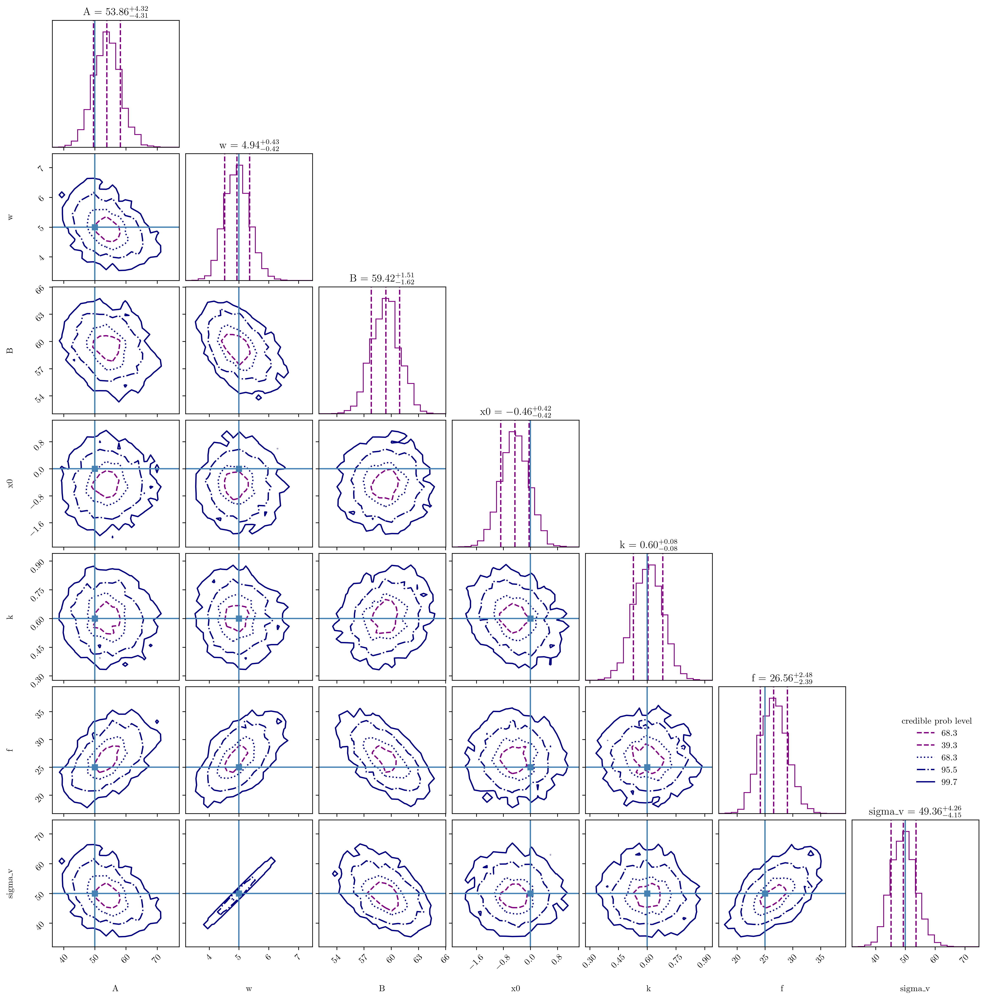

In [119]:
# NOTE: EDIT below to make the corner plot
cornerplot(results_spec_calib_nob, truths=param_true_calib_nob + derived_true)
pass

In [120]:
# Compute log Bayes factor comparing model with (results_spec_calib) vs without b (results_spec_calib_nob)
logz_calib = results_spec_calib['logz']
logzerr_calib = results_spec_calib.get('logzerr', np.nan)

logz_calib_nob = results_spec_calib_nob['logz']
logzerr_calib_nob = results_spec_calib_nob.get('logzerr', np.nan)

log_bayes_factor_b = logz_calib - logz_calib_nob
log_bayes_factor_err = np.sqrt((logzerr_calib if np.isfinite(logzerr_calib) else 0.0)**2 +
                               (logzerr_calib_nob if np.isfinite(logzerr_calib_nob) else 0.0)**2)

# linear Bayes factor (may overflow for very large values)
bayes_factor_b = np.exp(log_bayes_factor_b) if np.isfinite(log_bayes_factor_b) and log_bayes_factor_b < 700 else np.inf

print(f'Log Bayes Factor (with b vs without b): {log_bayes_factor_b:.3f} ± {log_bayes_factor_err:.3f}')
print(f'Bayes Factor (with b / without b): {bayes_factor_b}')

Log Bayes Factor (with b vs without b): -0.047 ± 0.571
Bayes Factor (with b / without b): 0.9541855806492162


### Exercise 3: Hubble diagram fitting

Assume the variable stars in Exercise 1 are used as standard candles to measure cosmological distances. The Hubble diagram relates the distance $d$ to the recession velocity $v$ of an object, given by Hubble's law:

$v = H_0 d$

where $H_0$ is the cosmic expansion rate (Hubble constant).

Assume the measurements are precise, but the recession velocities have an additional Gaussian scatter due to peculiar velocities of galaxies, characterized by a standard deviation $\sigma$:

$v_i = H_0 d_i + \epsilon_i$,

where $\epsilon_i \sim \mathcal{N}(0, \sigma^2)$.

#### Question 3.1: Hubble constant inference

**Tasks:**
1. Simulate a dataset of 50 variable stars with distances $d_i$ uniformly distributed between 10 Mpc and 100 Mpc. The recession velocities $v_i$ are generated using Hubble's law with a true Hubble constant $H_0 = 70$ km/s/Mpc, plus Gaussian noise with a standard deviation of $\sigma = 500$ km/s to account for peculiar velocities. Plot the simulated Hubble diagram data.
2. Infer the Hubble constant $H_0$ and peculiar velocity dispersion $\sigma$ using the `UltraNest` package with a uniform prior over the range $H_0 \in [50, 100]$ km/s/Mpc and $\sigma \in [100, 1500]$ km/s.
3. Plot the joint and marginalized posterior distributions of $H_0$ and $\sigma$.
4. Report the mean, standard deviation, and 16-50-84 percentiles of the marginalized posterior distribution of $H_0$.

In [121]:
def sim_hubble_diagram(num, H0=70, sigma=500, dmin=10, dmax=100, seed=42):
    """Simulate a Hubble diagram with Gaussian noise from peculiar velocities.
    Args:
        num: int, number of data points
        H0: float, Hubble constant in km/s/Mpc
        sigma: float, velocity dispersion in km/s
        dmin: float, minimum distance in Mpc
        dmax: float, maximum distance in Mpc
        seed: int, random seed for reproducibility
    Returns:
        d: array, distances in Mpc
        v_obs: array, observed velocities in km/s
    """
    # NOTE: EDIT below to complete the function
    rng = np.random.default_rng(seed)
    d = rng.uniform(dmin, dmax, num)
    v_obs = H0 * d + rng.normal(0.0, sigma, num)
    return d, v_obs

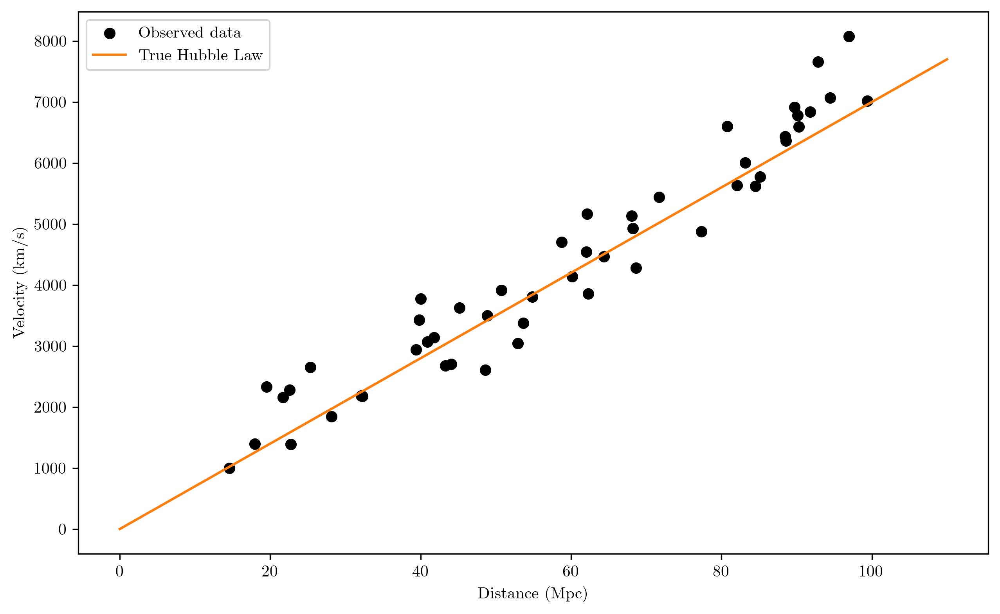

In [ ]:
seed = 2024011182
num = 50
param_names = ['H0', 'sigma']
param_true = [70, 500]
param_ranges = np.array([(50, 100), (100, 1500)])

d_obs, v_obs = sim_hubble_diagram(num, H0=param_true[0], sigma=param_true[1], seed=seed)

plt.figure(figsize=(10, 6))

plt.scatter(d_obs, v_obs, label='Observed data', color='k')
d_model = np.linspace(0, 110, 100)
v_model = param_true[0] * d_model
plt.plot(d_model, v_model, label='True Hubble Law', color='tab:orange')

plt.xlabel('Distance (Mpc)')
plt.ylabel('Velocity (km/s)')
plt.legend()
plt.show()

In [123]:
# Bayesian inference functions for UltraNest sampler
def prior_transform_hubble(cube):
    """Transform unit cube to uniform prior space for H0 and sigma.
    Args:
        cube: array, unit cube samples
    Returns:
        params: array, transformed parameters
    """
    # NOTE: EDIT below to complete the prior transform
    params = np.zeros_like(cube)
    for i, (pmin, pmax) in enumerate(param_ranges):
        params[i] = pmin + (pmax - pmin) * cube[i]
    return params

def log_likelihood_hubble(params, d_data, v_data):
    """Gaussian log-likelihood for v = H0 * d with scatter sigma.
    Args:
        params: array, model parameters [H0, sigma]
        d_data: array, observed distances
        v_data: array, observed velocities
    Returns:
        logL: float, log-likelihood value
    """
    # NOTE: EDIT below to complete the log-likelihood calculation
    H0, sigma = params
    # enforce positive sigma
    if sigma <= 0 or not np.isfinite(sigma):
        return -np.inf
    v_model = H0 * d_data
    resid = v_data - v_model
    n = resid.size
    const = -0.5 * n * np.log(2 * np.pi * sigma**2)
    chi2 = -0.5 * np.sum((resid / sigma) ** 2)
    logL = const + chi2
    return float(logL)

In [124]:
# Create and run the UltraNest sampler for the Hubble diagram
log_dir = 'hubble'

# Use the Hubble parameter names defined earlier (['H0', 'sigma'])
param_hubble = param_names

# Create the sampler and pass the observed data arrays to the likelihood
sampler_hubble = ReactiveNestedSampler(
    param_hubble,
    lambda p: log_likelihood_hubble(p, d_obs, v_obs),
    prior_transform_hubble,
    log_dir=log_dir
)

results_hubble = sampler_hubble.run()

Creating directory for new run hubble/run1


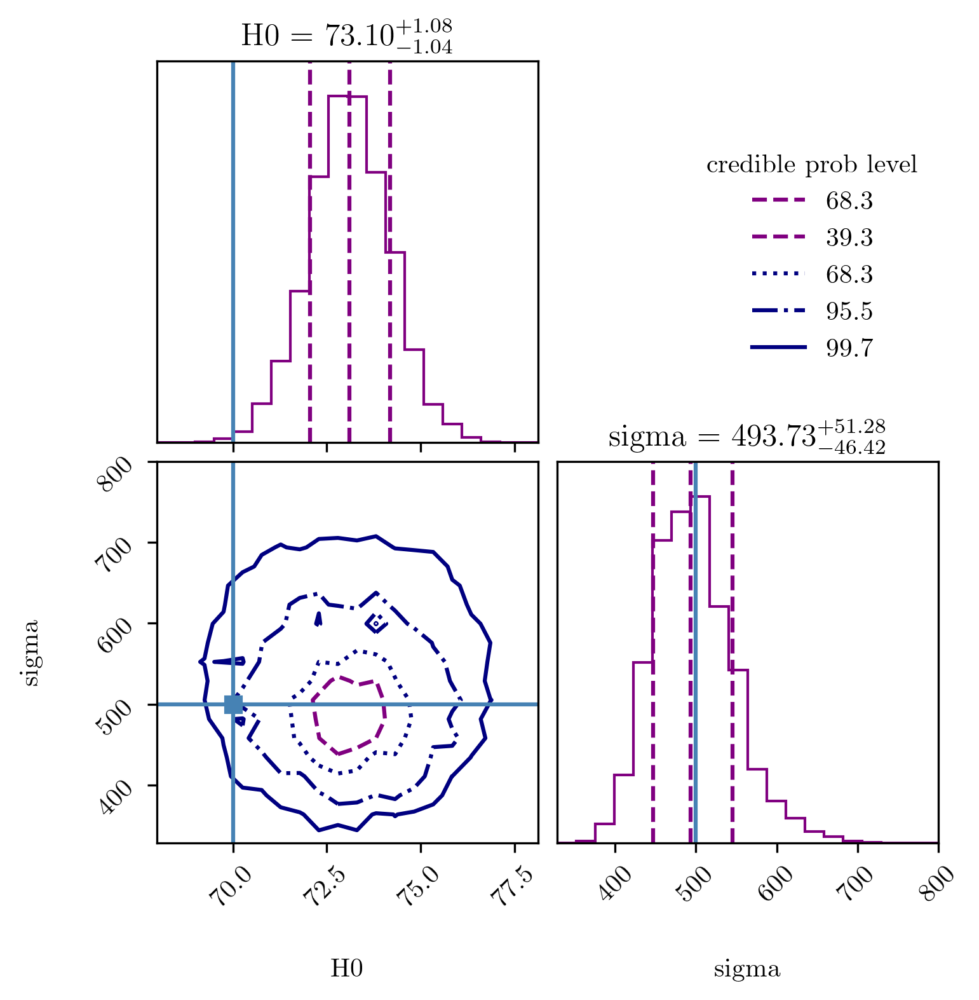

In [125]:
# NOTE: EDIT below to make the corner plot
cornerplot(results_hubble, truths=param_true)
pass

In [126]:
# NOTE: EDIT below to report summary statistics
# Report summary statistics for results_spec_biased
res = results_spec_biased
names = res['paramnames']
samples = res.get('samples', res['weighted_samples']['points'])
df_res = pd.DataFrame(samples, columns=names)

print(f"Number of posterior samples: {df_res.shape[0]}")
if 'logz' in res:
    print(f"Log-evidence (logZ): {res['logz']:.6g}  ± {res.get('logzerr', np.nan):.6g}")
print()

print("Descriptive statistics (including 16/50/84 percentiles):")
display(df_res.describe(percentiles=[0.16, 0.5, 0.84]))

# Explicit 16/50/84 percentiles table
pct = np.percentile(samples, [16, 50, 84], axis=0).T
df_pct = pd.DataFrame(pct, index=names, columns=['P16', 'P50', 'P84'])
print("\nPercentiles (16/50/84):")
display(df_pct)

# Mean and standard deviation
means = df_res.mean()
stds = df_res.std(ddof=1)
df_stats = pd.DataFrame({'mean': means, 'std': stds})
print("\nMean and standard deviation:")
display(df_stats)

# Covariance and correlation matrices
cov = df_res.cov()
corr = df_res.corr()

print("\nCovariance matrix:")
display(cov)

print("\nCorrelation matrix:")
display(corr)

# Maximum-likelihood info if available
if 'maximum_likelihood' in res:
    ml = res['maximum_likelihood']
    print("\nMaximum-likelihood logL:", ml.get('logl'))
    if ml.get('point') is not None:
        try:
            display(pd.Series(ml['point'], index=names))
        except Exception:
            # fallback if shapes differ
            print("Maximum-likelihood point (array):", ml.get('point'))

Number of posterior samples: 6911
Log-evidence (logZ): -215.062  ± 0.28392

Descriptive statistics (including 16/50/84 percentiles):


,A,w,B,x0,f,sigma_v
count,6911.000000,6911.000000,6911.000000,6911.000000,6911.000000,6911.000000
mean,53.949639,4.975316,59.298064,0.440475,26.761429,49.753161
std,4.381937,0.470764,1.602727,0.426493,2.598471,4.707644
min,38.063131,3.508343,53.504158,-1.044797,17.625409,35.083433
16%,49.609767,4.520479,57.716251,0.021621,24.242975,45.204794
50%,53.765030,4.942921,59.304163,0.429753,26.678065,49.429208
84%,58.316035,5.442124,60.902015,0.873952,29.345219,54.421237
max,69.000594,7.273710,65.096888,1.969774,37.697309,72.737104



Percentiles (16/50/84):


,P16,P50,P84
A,49.609767,53.765030,58.316035
w,4.520479,4.942921,5.442124
B,57.716251,59.304163,60.902015
x0,0.021621,0.429753,0.873952
f,24.242975,26.678065,29.345219
sigma_v,45.204794,49.429208,54.421237



Mean and standard deviation:


,mean,std
A,53.949639,4.381937
w,4.975316,0.470764
B,59.298064,1.602727
x0,0.440475,0.426493
f,26.761429,2.598471
sigma_v,49.753161,4.707644



Covariance matrix:


,A,w,B,x0,f,sigma_v
A,19.201372,-0.802336,-1.661693,-0.195709,5.185635,-8.023364
w,-0.802336,0.221619,-0.357337,0.046378,0.781943,2.216191
B,-1.661693,-0.357337,2.568733,-0.071267,-2.742698,-3.573365
x0,-0.195709,0.046378,-0.071267,0.181896,0.149330,0.463776
f,5.185635,0.781943,-2.742698,0.149330,6.752053,7.819432
sigma_v,-8.023364,2.216191,-3.573365,0.463776,7.819432,22.161913



Correlation matrix:


,A,w,B,x0,f,sigma_v
A,1.000000,-0.388944,-0.236606,-0.104721,0.455426,-0.388944
w,-0.388944,1.000000,-0.473603,0.230990,0.639225,1.000000
B,-0.236606,-0.473603,1.000000,-0.104260,-0.658568,-0.473603
x0,-0.104721,0.230990,-0.104260,1.000000,0.134747,0.230990
f,0.455426,0.639225,-0.658568,0.134747,1.000000,0.639225
sigma_v,-0.388944,1.000000,-0.473603,0.230990,0.639225,1.000000



Maximum-likelihood logL: -203.29279122049047


A          54.383761
w           4.897237
B          59.318791
x0          0.389422
f          26.633017
sigma_v    48.972371
dtype: float64

#### Question 3.2: outliers

We now observe that a few data points in the Hubble diagram are significant outliers, possibly due to misidentification of variable stars. As a result, the distances of these objects are underestimated by around 50%.

**Tasks:**
1. Randomly select 5 data points from the simulated dataset in Question 3.1 and multiply their distances $d_i$ by a uniform fraction in $[0.4, 0.6]$ to simulate outliers. Plot the modified Hubble diagram data, and overlay the true Hubble law for comparison.
2. Repeat the inference from Question 3.1 using the modified dataset with outliers.
3. Compare the inference results of $H_0$ and $\sigma$ with and without outliers.

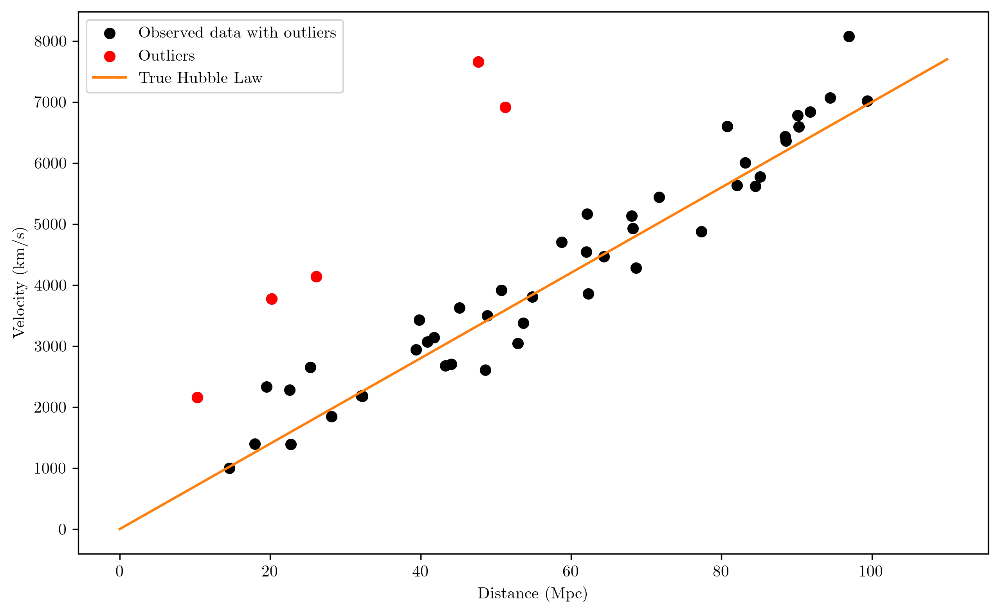

In [127]:
# Contaminate the data with outliers
num_outliers = 5
rng = np.random.default_rng(seed + 1)
outlier_indices = rng.choice(num, num_outliers, replace=False)
d_obs_outliers = d_obs.copy()
d_obs_outliers[outlier_indices] *= rng.uniform(0.4, 0.6, num_outliers)

# Plot the contaminated data
plt.figure(figsize=(10, 6))

plt.scatter(d_obs_outliers, v_obs, label='Observed data with outliers', color='k')
plt.scatter(d_obs_outliers[outlier_indices], v_obs[outlier_indices], label='Outliers', color='r')
plt.plot(d_model, v_model, label='True Hubble Law', color='tab:orange')

plt.xlabel('Distance (Mpc)')
plt.ylabel('Velocity (km/s)')
plt.legend()
plt.show()

In [128]:
# Create and run the UltraNest sampler for the Hubble diagram with outliers
log_dir = 'hubble_outliers'

# NOTE: EDIT below to create the sampler
sampler_hubble_outliers = ReactiveNestedSampler(
    param_hubble,
    lambda p: log_likelihood_hubble(p, d_obs_outliers, v_obs),
    prior_transform_hubble,
    log_dir=log_dir
)

results_hubble_outliers = sampler_hubble_outliers.run()

Creating directory for new run hubble_outliers/run1


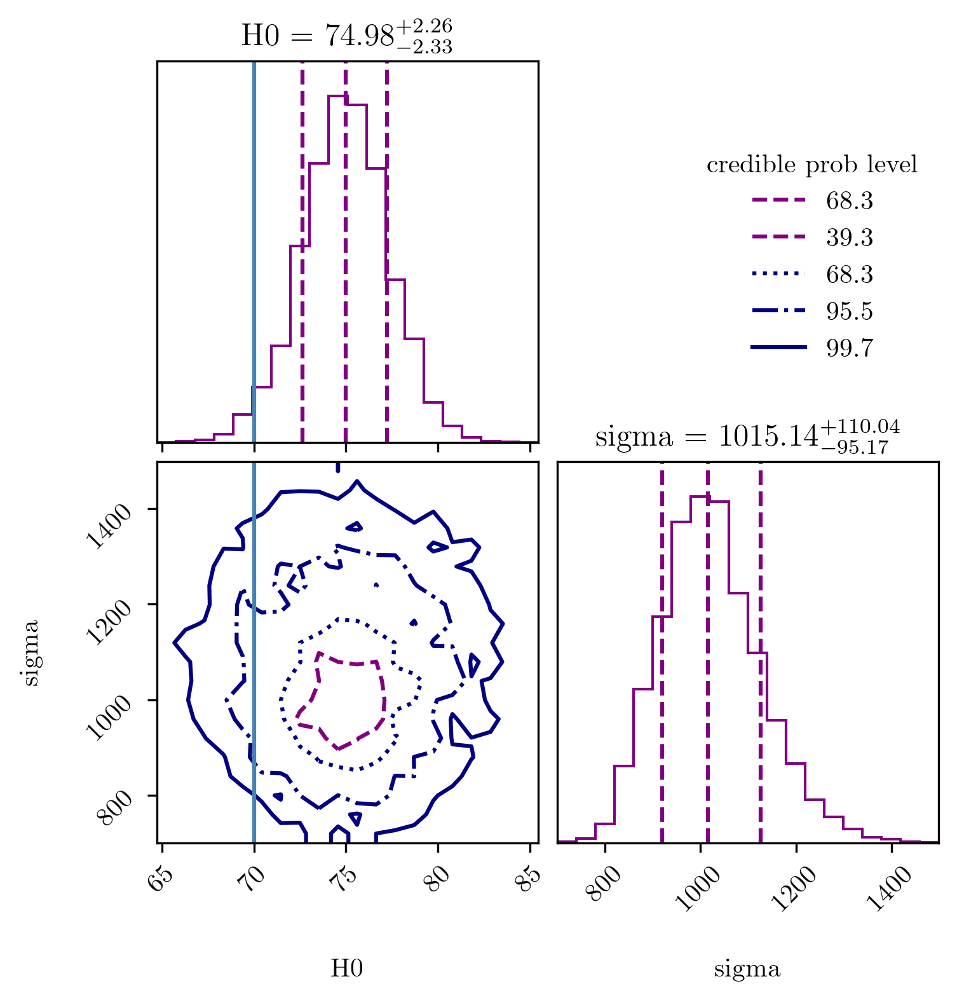

In [129]:
# NOTE: EDIT below to compare the results (do not forget to make the corner plot with two cases labeled)
cornerplot(results_hubble_outliers, truths=param_true)
pass

很明显，这里和真值的偏移已经非常大了.

#### Question 3.3: robust inference with mixture model

To robustly account for outliers in the Hubble diagram data, we can use a mixture model approach. In this model, each data point has a probability $(1-\epsilon)$ of being an inlier (following the Hubble law with Gaussian scatter) and a probability $\epsilon$ of being an outlier (following a broader distribution). In this case, the likelihood for each data point can be expressed as:

$\mathcal{L}_i = (1 - \epsilon) \mathcal{N}(v_i | H_0 d_i, \sigma_{\rm in}^2) + \epsilon \mathcal{N}(v_i | H_0 d_i, \sigma_{\rm out}^2)$,

where $\sigma_{\rm in} = \sigma$ is the standard deviation for the inliers, and $\sigma_{\rm out}^2 = \sigma^2 + (H_0 \tau)^2$ is the variance for the outliers, with $\tau$ representing the additional uncertainty due to distance measurement. Assume that the actual bias in distances for outliers are unknown, so we model it as an additional Gaussian scatter in velocity space.

Here, $\mathcal{N}(v_i | \mu_i, \sigma_i^2)$ denotes the Gaussian probability density function:

$\mathcal{N} (v_i | \mu_i, \sigma_i^2) = \dfrac{1}{\sqrt{2 \pi \sigma_i^2}} \exp\left[-\dfrac{(v_i - \mu_i)^2}{2 \sigma_i^2}\right]$


**Tasks:**
1. Implement the mixture model for the Hubble diagram data, introducing two additional parameters: the outlier fraction $\epsilon$ and the additional scatter $\tau$. Assume a uniform prior of $\tau \in [0, 50]$ Mpc and a Beta prior $p(\epsilon|I) \sim {\rm Beta} (1,9)$ that favors low values of $\epsilon$.
2. Repeat the inference from Question 3.2 using the mixture model on the modified dataset with outliers.
3. Plot the joint and marginalized posterior distributions of $H_0$, $\sigma$, $\epsilon$, and $\tau$.
4. Report the summary statistics of $H_0$ and $\sigma$ from the mixture model inference, and compare them with the results from Question 3.2.
5. Discuss all your results in the whole exercise.

In [130]:
from scipy.stats import beta

def prior_transform_hubble_mixture(cube, ranges):
    """Transform unit cube to uniform prior space for mixture model.
    Args:
        cube: array, unit cube samples
        ranges: list of tuples, parameter ranges [(min, max), ...]
    Returns:
        params: array, transformed parameters
    """
    params = np.zeros_like(cube)
    for i, (pmin, pmax) in enumerate(ranges):
        if i == 2:  # For epsilon, apply the Beta prior transformation
            params[i] = beta.ppf(cube[i], 1, 9)
        else:
            params[i] = pmin + (pmax - pmin) * cube[i]
    return params

def log_likelihood_hubble_mixture(params, d_data, v_data):
    """Compute the log-likelihood of the observed data given the mixture model parameters.
    Args:
        params: array, model parameters [H0, sigma, epsilon, tau]
        d_data: array, observed distances
        v_data: array, observed velocities
    Returns:
        log_likelihood: float, log-likelihood value
    """
    H0, sigma, epsilon, tau = params
    # NOTE: EDIT below to complete the log-likelihood calculation
    # validate parameters
    if (sigma <= 0) or (tau < 0) or (epsilon < 0) or (epsilon > 1) or (not np.isfinite(H0)) \
       or (not np.isfinite(sigma)) or (not np.isfinite(epsilon)) or (not np.isfinite(tau)):
        return -np.inf

    mu = H0 * d_data
    sigma_in = float(sigma)
    sigma_out = np.sqrt(sigma_in**2 + (H0 * tau)**2)

    # avoid non-positive variances
    if sigma_out <= 0:
        return -np.inf

    # log of Gaussian PDFs
    resid = v_data - mu
    log_pref_in = -0.5 * np.log(2 * np.pi * sigma_in**2)
    log_exp_in = -0.5 * (resid**2) / (sigma_in**2)
    log_pdf_in = log_pref_in + log_exp_in

    log_pref_out = -0.5 * np.log(2 * np.pi * sigma_out**2)
    log_exp_out = -0.5 * (resid**2) / (sigma_out**2)
    log_pdf_out = log_pref_out + log_exp_out

    # mixture log-likelihood per point using log-sum-exp for stability
    log_term_in = np.log(1.0 - epsilon) + log_pdf_in
    log_term_out = np.log(epsilon) + log_pdf_out
    log_likes = np.logaddexp(log_term_in, log_term_out)

    log_likelihood = np.sum(log_likes)
    return log_likelihood

In [131]:
param_mixture_names = ['H0', 'sigma', 'epsilon', 'tau']
param_mixture_ranges = np.array([(50, 100), (100, 1500), (0, 1), (0, 50)])
param_mixture_true = [70, 500, 0.1, None]

# Create and run the UltraNest sampler for the Hubble diagram with mixture model
log_dir = 'hubble_mixture'

# NOTE: EDIT below to create the sampler
sampler_hubble_mixture = ReactiveNestedSampler(
    param_mixture_names,
    lambda p: log_likelihood_hubble_mixture(p, d_obs_outliers, v_obs),
    # pass a one-argument prior_transform callable that closes over the ranges
    lambda cube: prior_transform_hubble_mixture(cube, param_mixture_ranges),
    log_dir=log_dir
)

results_hubble_mixture = sampler_hubble_mixture.run()

Creating directory for new run hubble_mixture/run1


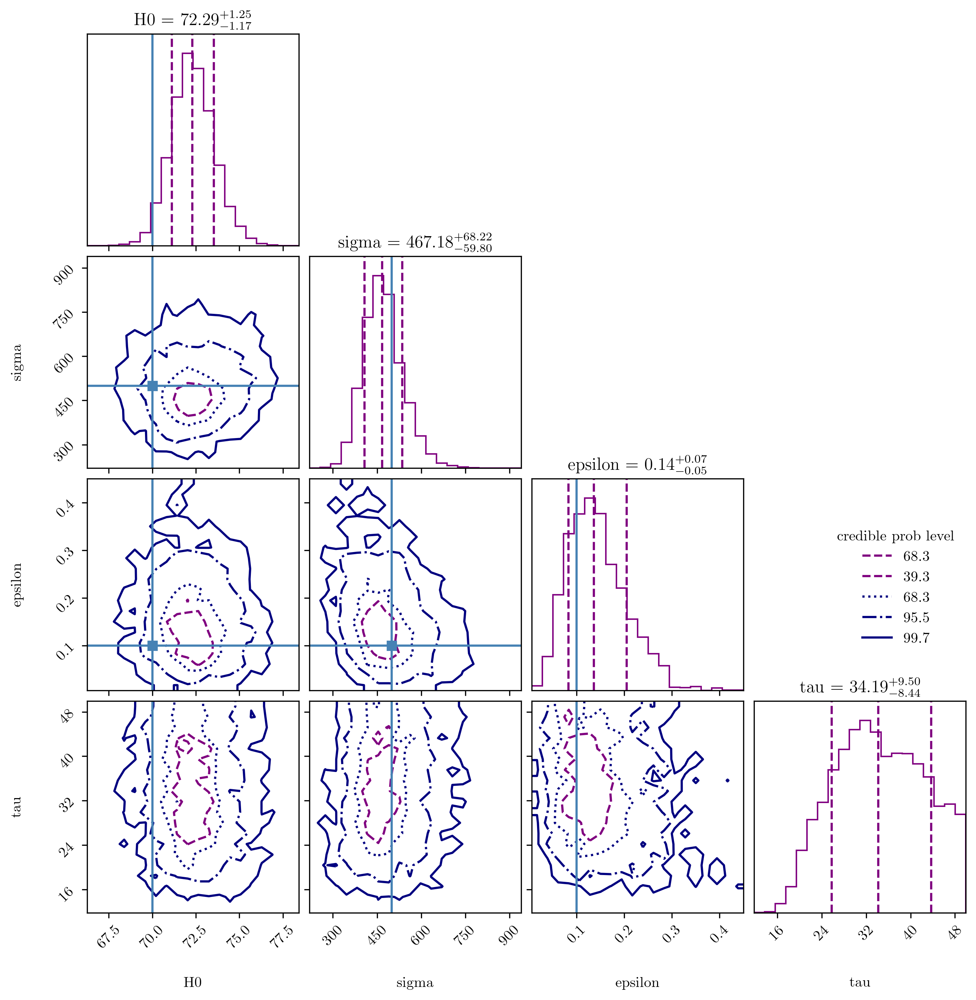

In [132]:
# NOTE: EDIT below to complete this question (please make the corner plot, and feel free to add more cells if needed)
cornerplot(results_hubble_mixture, truths=param_mixture_true)
pass

##### Discussions

这三种不同情况的对比能够很容易看出，加入 outlier 之后的真值和估计值差距比较大，在没有加入 outlier 之前的真值估计算是比较准确，但是还没有达到足够的精度，只有最后一种同时考虑到 inlier 和 outlier 的模型做出了最准确的真值估计.

### Note: steps for submitting the exercise

1. In the menu bar, select `File > Download` to download your notebook as a `.ipynb` file.
2. Select `File > Save and Export Notebook As > PDF` to export your notebook as a PDF file.
3. Combine the `.ipynb` and `.pdf` files into a single `.zip` or `.tar.gz` archive.
4. Upload your archive to the web learning platform (网络学堂).